In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pywt
import cPickle

import os
import re
import numpy as np
import scipy.interpolate as scinterpolate
import matplotlib.pyplot as plt

from ipywidgets import interact
from scipy import signal


In [2]:
def interpolate(x, y, dt):
    x = np.array(x)
    y = np.array(y)

    f = scinterpolate.interp1d(x, y, kind='linear')

    newx = np.arange(x.min(), x.max(),step=dt)
    newy = f(newx)
    
    return newx, newy

In [3]:
from scipy.signal import butter, lfilter


def butter_bandpass(lowcut, highcut, fs, order=5):
 nyq = 0.5 * fs
 low = lowcut / nyq
 high = highcut / nyq
 b, a = butter(order, [low, high], btype='band')
 return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
   b, a = butter_bandpass(lowcut, highcut, fs, order=order)
   y = lfilter(b, a, data)
   return y

In [70]:
def load_result(paramset='ParameterSetBase', dt=0.1, sniff_count=3):
    result_dir = os.path.join('..', 'olfactorybulb', 'results', paramset)
    
    with open(os.path.join(result_dir, 'input_times.pkl')) as f:
        input_times = cPickle.load(f)
        input_times.sort(key=lambda row: row[0])

    events = {}
    for entry in input_times:
        seg_name = entry[0]
        seg_times = events.get(seg_name,[])
        events[seg_name] = seg_times + entry[1]

    
    with open(os.path.join(result_dir, 'soma_vs.pkl')) as f:
        vs = cPickle.load(f)
        vs.sort(key=lambda row: row[0])
        
    with open(os.path.join(result_dir, 'lfp.pkl')) as f:
        t, lfp = cPickle.load(f)
        t = np.array(t)
        lfp = np.array(lfp)
        t, lfp = interpolate(t,lfp, dt)
       
    # Filter out very high frequencies
    lfp = butter_bandpass_filter(lfp, 0.1, 1000, 1/dt*1000, order=4)
        
    # Band pass filter LFP
    lfp_bp = butter_bandpass_filter(lfp, 30, 120, 1/dt*1000, order=4)
    
        
    # Wavelet decomposition
    wavelet="cgau5"
    scale_low=3     # 140 Hz
    scale_high=32   # 20 Hz
    
    scales = np.linspace(scale_low/dt, scale_high/dt, 50)     
    cfs, frequencies = pywt.cwt(lfp_bp, scales, wavelet, dt / 1000.0)
    lfp_wavelet_power = np.log(1+abs(cfs))
    
    # Average spectrum across sniffs
    sniff_duration = 200
    skip_first_n_sniffs = 1
    num_sniffs = sniff_count
    
    step = int(round(sniff_duration / dt))
    lfp_wavelet_power_average = sum([lfp_wavelet_power[:,i*step:(i+1)*step-2] for i in range(num_sniffs+skip_first_n_sniffs)[skip_first_n_sniffs:]])
    t_average = t[0:step-2]
    
    return events, vs, t, lfp, lfp_bp, lfp_wavelet_power, frequencies, t_average, lfp_wavelet_power_average
    
def show_plots(paramset='ParameterSetBase',sniff_count=3):

    fig_width = 27
    dt = 0.1 # ms
    
    events, vs, t_lfp, lfp, lfp_bp, lfp_wavelet_power, \
        frequencies, t_average, lfp_wavelet_power_average = load_result(paramset, dt, sniff_count)    
        
    i = 0
    plt.subplots(figsize=(fig_width, len(vs)*0.1))
    for cell, t, v in vs:
        if 'MC' in cell:
            col = 'blue'
        if 'TC' in cell:
            col = 'pink'
        if 'GC' in cell:
            col = 'gold'
        plt.plot(t,np.array(v)+i,col,label=cell)
        i += 100
    
    events = [(seg, times) for seg, times in events.items()]
    events.sort(key=lambda row: row[0])
    
    for seg, times in events:
        if 'MC' in seg:
            col = 'b'
        if 'TC' in seg:
            col = 'y'
        plt.plot(times, [i]*len(times),col+'|',ms=5,label=seg)
#         print(seg,'spikes:',len(times))
        i += 100
    
    plt.xticks(np.arange(min(t), max(t)+1, 50.0))
    plt.margins(0)
    plt.show()

    t = t_lfp

    # Plot raw LFP
    plt.subplots(figsize=(fig_width, 5))
    plt.margins(0)
    plt.plot(t,lfp*1000)    
    
    
    # Plot BP filtered LFP
    plt.plot(t,lfp_bp*10000-200)    
    plt.xticks(np.arange(min(t), max(t)+1, 50.0))
    plt.show()
    
#     #Fourier spectrogram - sanity check
#     f, tff, Sxx = signal.spectrogram(y, 1/dt*1000, nperseg=256, scaling='spectrum', mode='magnitude')
#     plt.subplots(figsize=(fig_width, 5))
#     #plt.pcolormesh(tff*1000, f, Sxx)
#     plt.contourf(tff*1000, f, np.log(1+Sxx), 13)
#     plt.ylabel('Frequency [Hz]')
#     plt.xlabel('Time [msec]')
#     plt.ylim((10,250))
#     plt.show()   
    

    
    plt.subplots(figsize=(fig_width, 5))
    plt.contourf(t, frequencies, lfp_wavelet_power, 256,cmap='jet')
    plt.ylim((20,140))
    plt.xticks(np.arange(round(min(t)), max(t)+1, 50.0))
    plt.ylabel('Frequency [Hz]')
    plt.show()
    
    plot_sniff_average(t_average, frequencies, lfp_wavelet_power_average)
    
def plot_sniff_average(t_average, frequencies, lfp_wavelet_power_average, show=True, yaxis=True, xlabel=True):
    if show:
        plt.subplots(figsize=(4, 5))
        
    plt.contourf(t_average, frequencies, lfp_wavelet_power_average, 256,cmap='jet')
    plt.ylim((20,140))
    
    if yaxis:
        plt.ylabel('Frequency [Hz]')   
    else:
        cur_axes = plt.gca()
        cur_axes.axes.get_yaxis().set_visible(False)
    
    if xlabel:
        plt.xlabel('Time Since Sniff Onset [ms]')
    
    
    plt.xticks(np.arange(round(min(t_average)), max(t_average)+1, 50.0)[:-1])
    
    if show:
        plt.show()
    
def plot_average_vs_paramsets(sets, labels=None, sniff_count=3):
    count = len(sets)
    
    #fig = plt.figure()
    plt.subplots(figsize=(count*4, 5))
    
    for i, paramset in enumerate(sets):
        plt.subplot(1, count, i+1)
        
        dt = 0.1 # ms
        
        events, vs, t_lfp, lfp, lfp_bp, lfp_wavelet_power, \
            frequencies, t_average, lfp_wavelet_power_average = load_result(paramset, dt, sniff_count) 
        
        plot_sniff_average(t_average, frequencies, lfp_wavelet_power_average, show=False, yaxis=i==0,xlabel=i==count/2)
        if labels is not None:
            plt.title(labels[i])

    
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()
    

## Silent Network

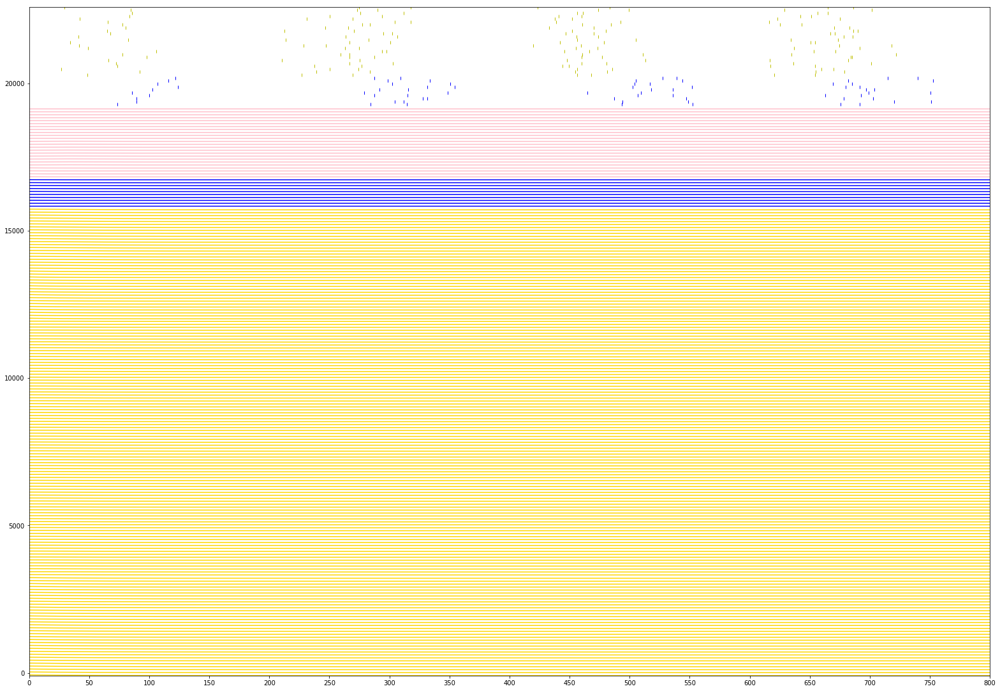

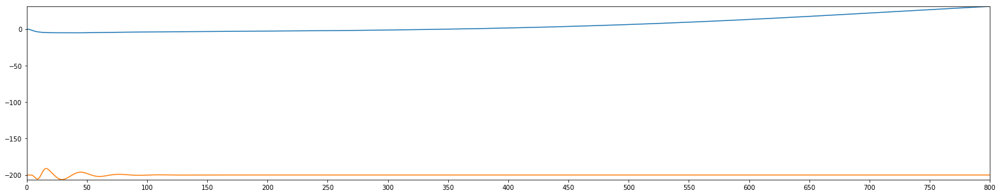

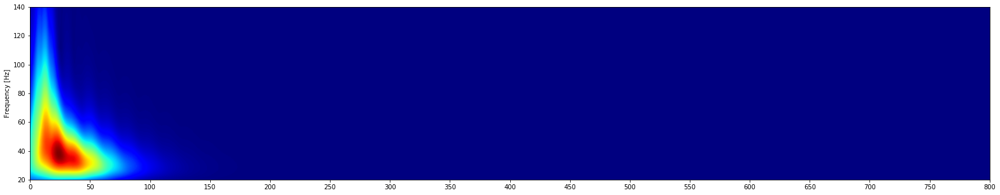

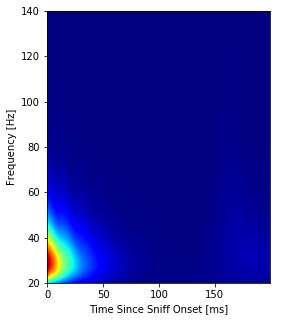

In [24]:
show_plots('SilentNetwork')

## MC Network

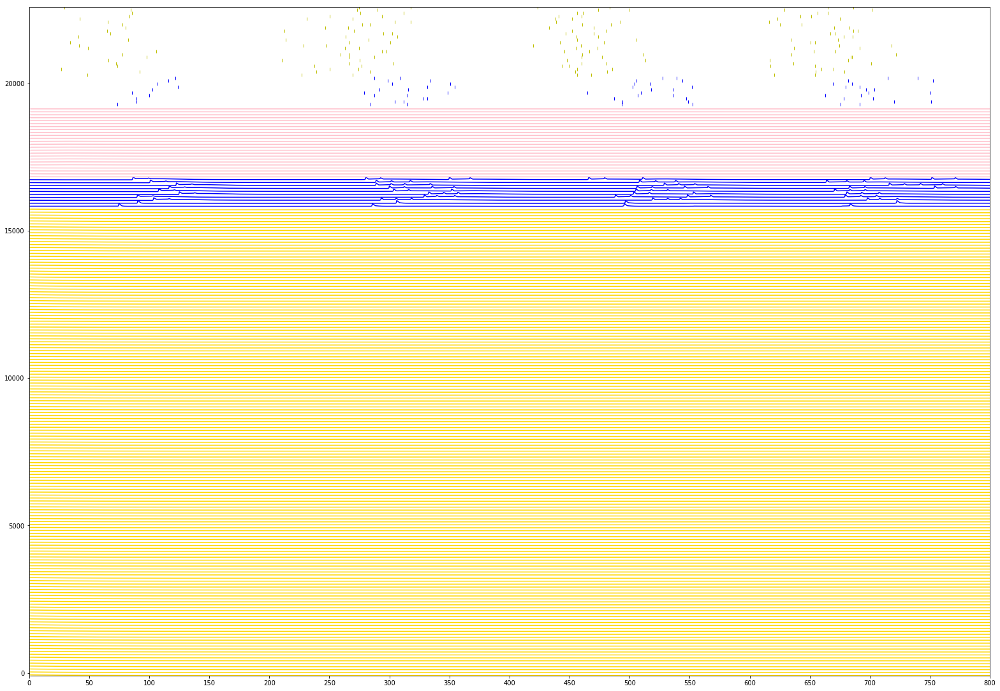

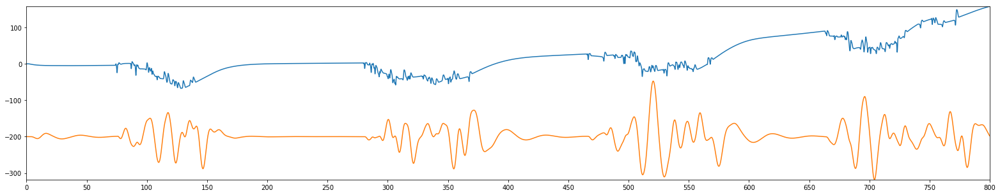

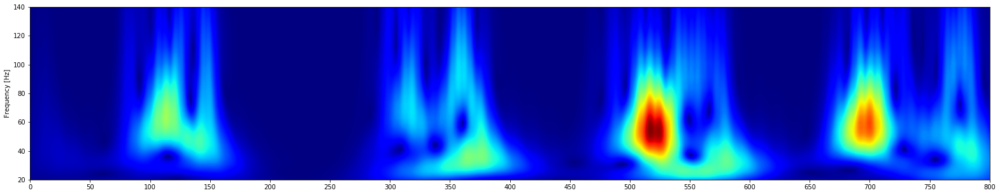

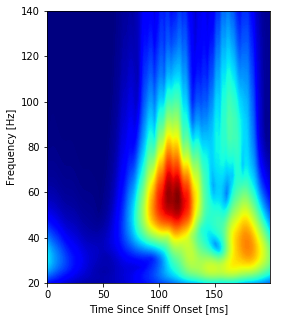

In [9]:
show_plots('PureMCs')

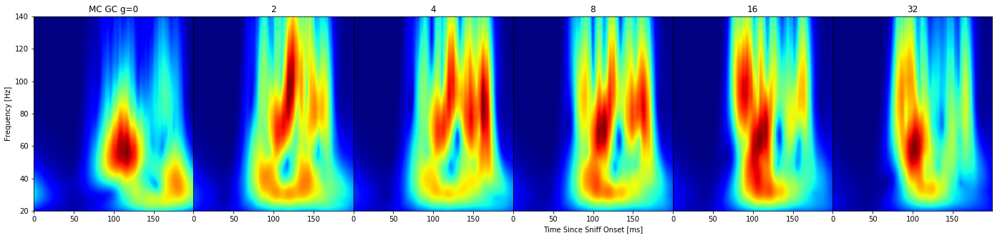

In [17]:
plot_average_vs_paramsets(['MCGJ_0',
                            'MCGJ_2',
                            'MCGJ_4',
                            'MCGJ_8',
                            'MCGJ_16',
                            'MCGJ_32'],
                           ['MC GC g=0',
                            '2',
                            '4',
                            '8',
                            '16',
                            '32'])

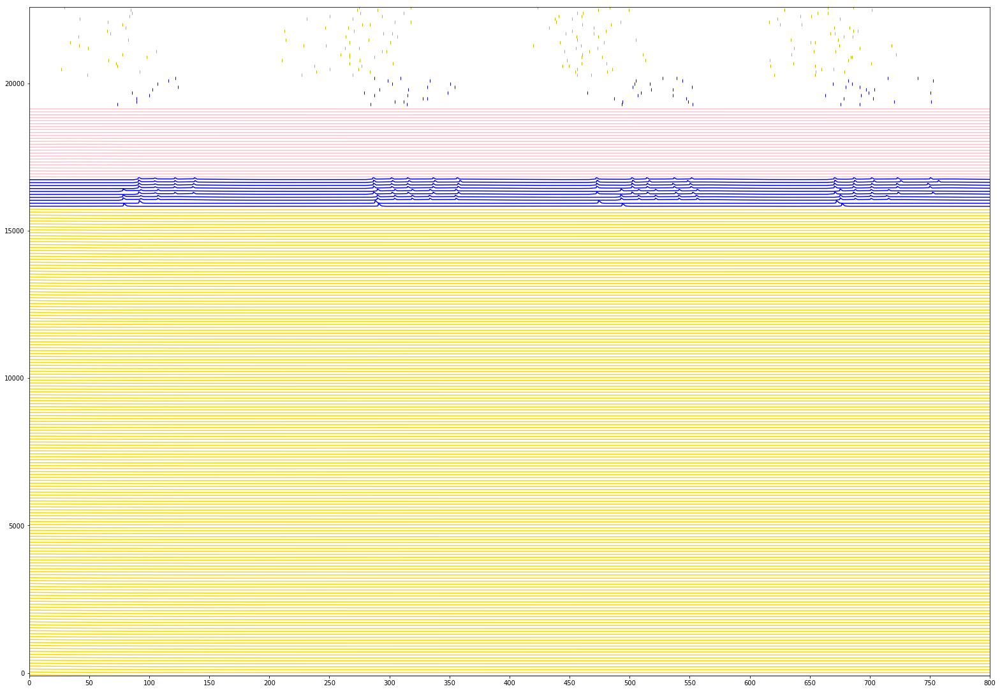

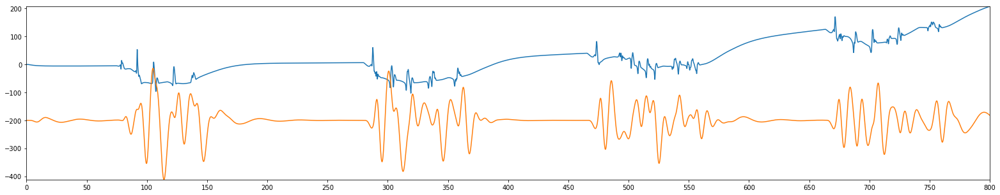

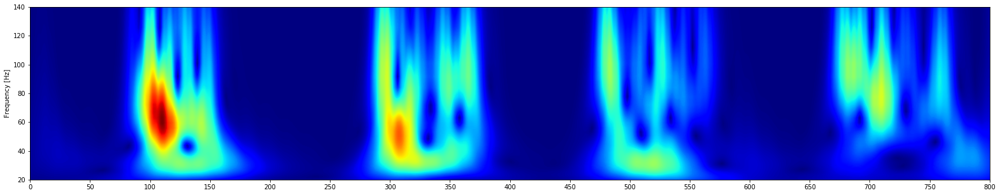

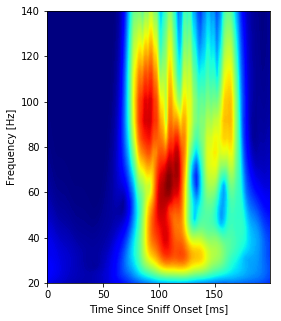

In [23]:
show_plots('PureMCsWithGJs')

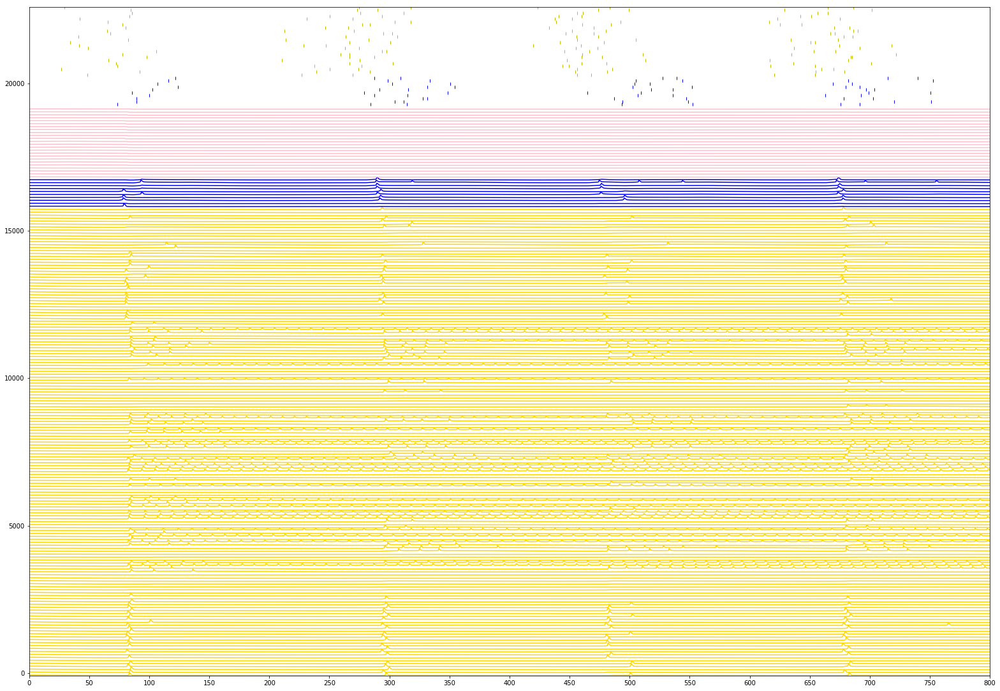

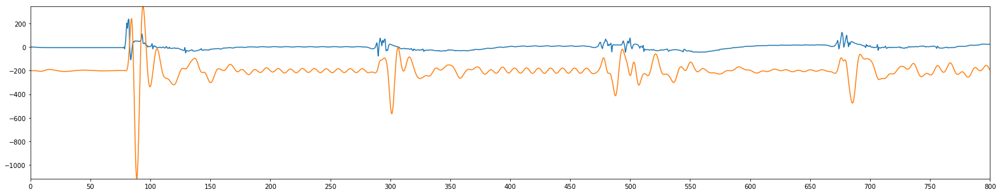

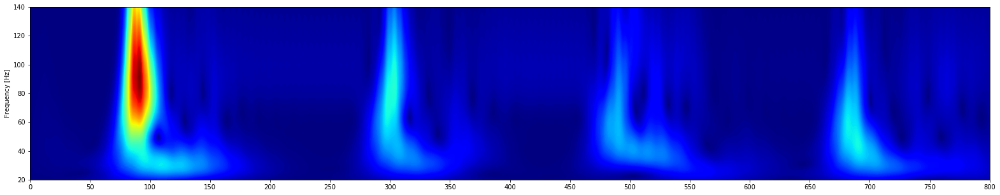

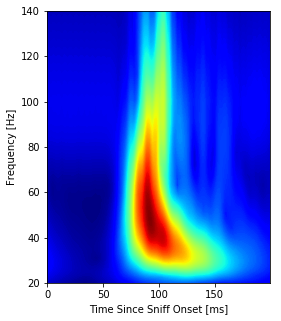

In [25]:
show_plots('MCsWithGJsGCs')

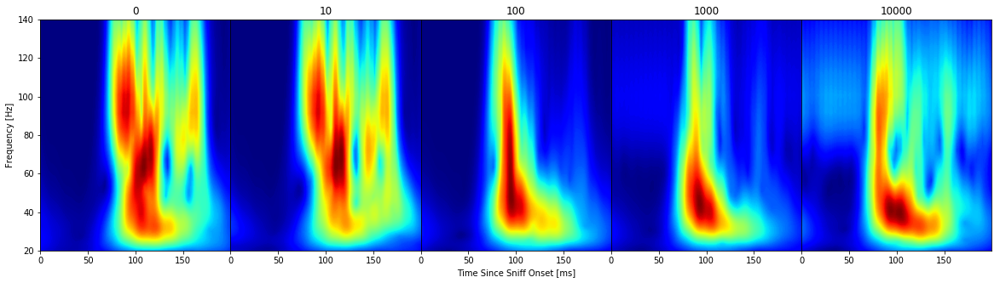

In [32]:
plot_average_vs_paramsets(
    ['MCsWithGJsGCsExc_0', 'MCsWithGJsGCsExc_10', 'MCsWithGJsGCsExc_100', 'MCsWithGJsGCsExc_1000', 'MCsWithGJsGCsExc_10000'],
    [0,10,100,1000,10000]
)

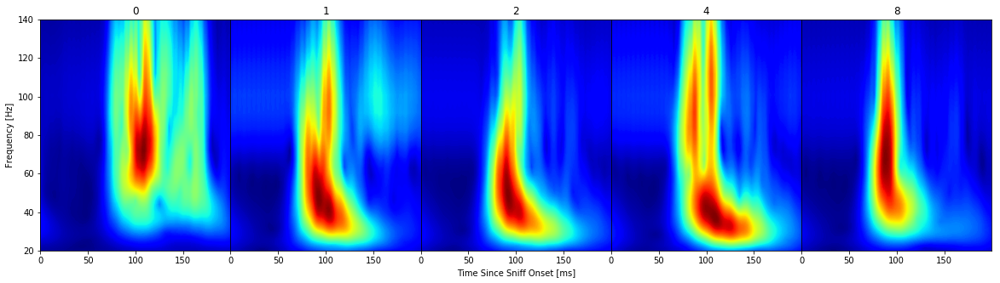

In [35]:
# Vary MC GC Inhib gmax=0 to 8
plot_average_vs_paramsets(['MCsWithGJsGCsInhib_0',
                'MCsWithGJsGCsInhib_1',
                'MCsWithGJsGCsInhib_2',
                'MCsWithGJsGCsInhib_4',
                'MCsWithGJsGCsInhib_8'], [0, 1, 2, 4, 8])

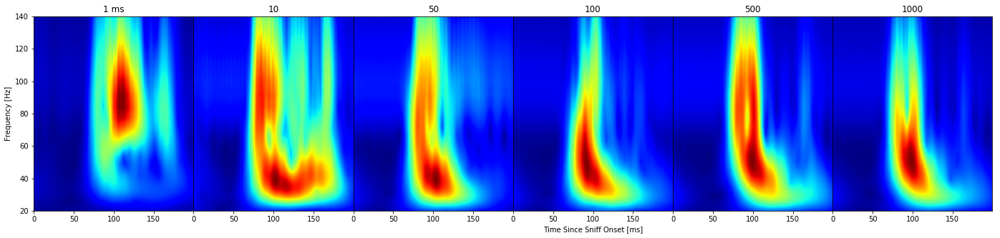

In [42]:
plot_average_vs_paramsets([
                'MCsWithGJsGCsTau2_1',
                'MCsWithGJsGCsTau2_10',
                'MCsWithGJsGCsTau2_50',
                'MCsWithGJsGCsTau2_100',
                'MCsWithGJsGCsTau2_500',    
                'MCsWithGJsGCsTau2_1000'], ["1 ms", 10, 50, 100, 500, 1000])

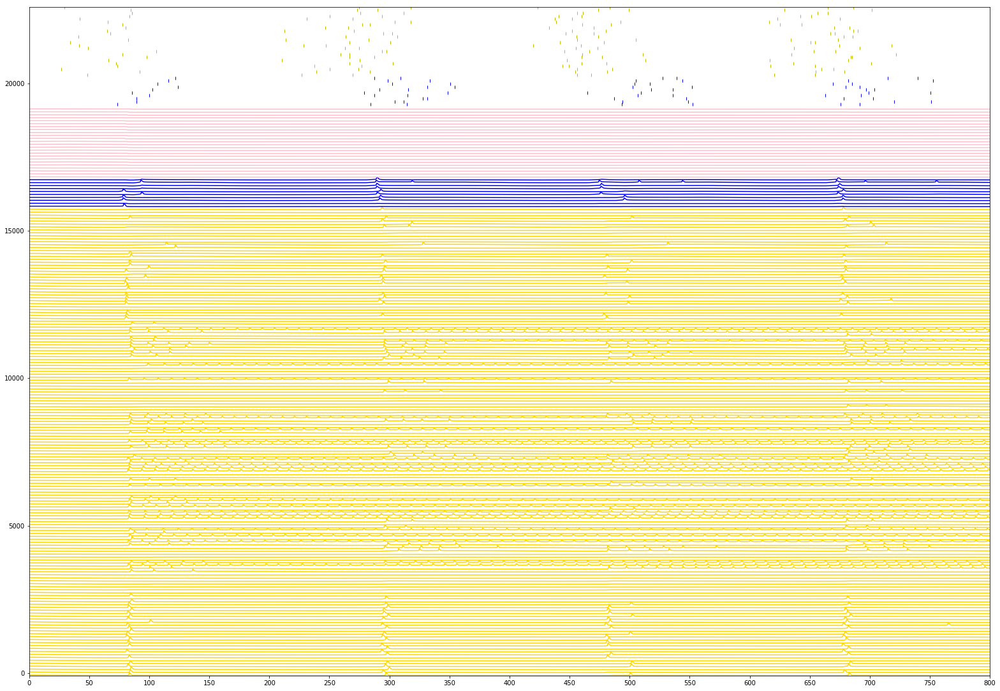

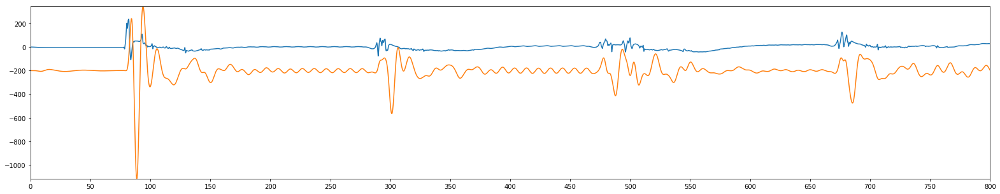

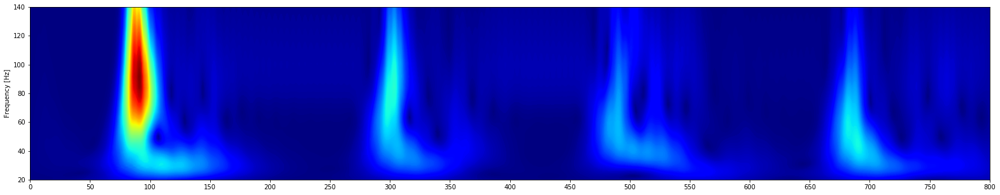

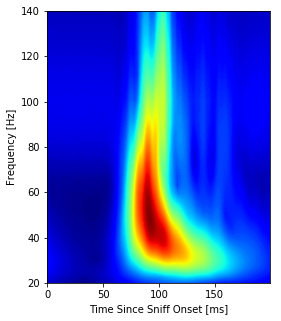

In [46]:
show_plots('MCsWithGJsGCs')

## TCs Alone

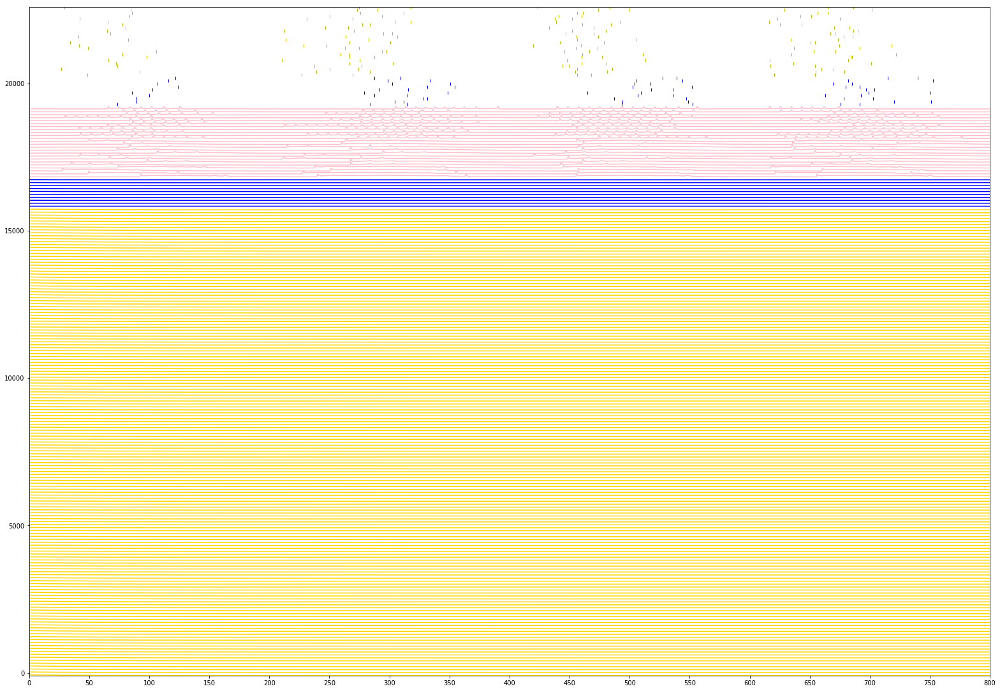

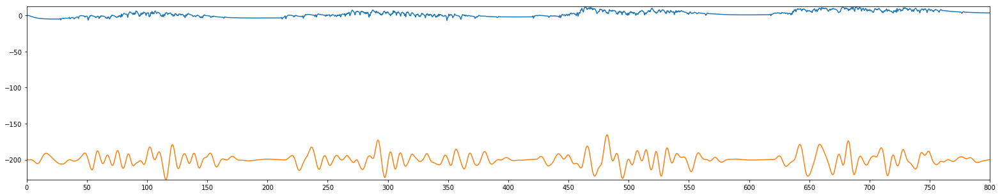

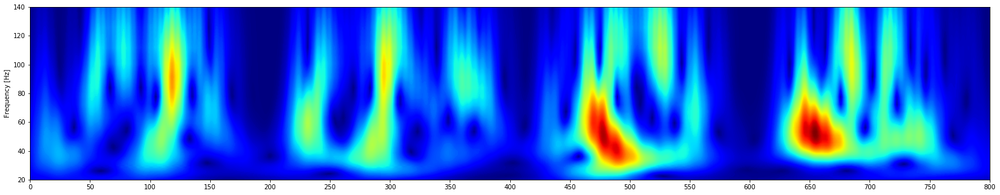

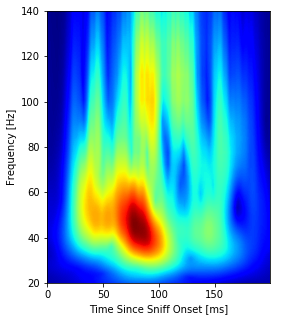

In [11]:
show_plots('PureTCs')

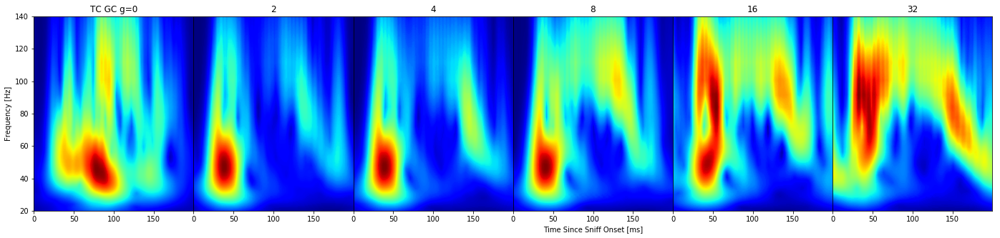

In [18]:
plot_average_vs_paramsets(['TCGJ_0',
                            'TCGJ_2',
                            'TCGJ_4',
                            'TCGJ_8',
                            'TCGJ_16',
                            'TCGJ_32'],
                           ['TC GC g=0',
                            '2',
                            '4',
                            '8',
                            '16',
                            '32'])

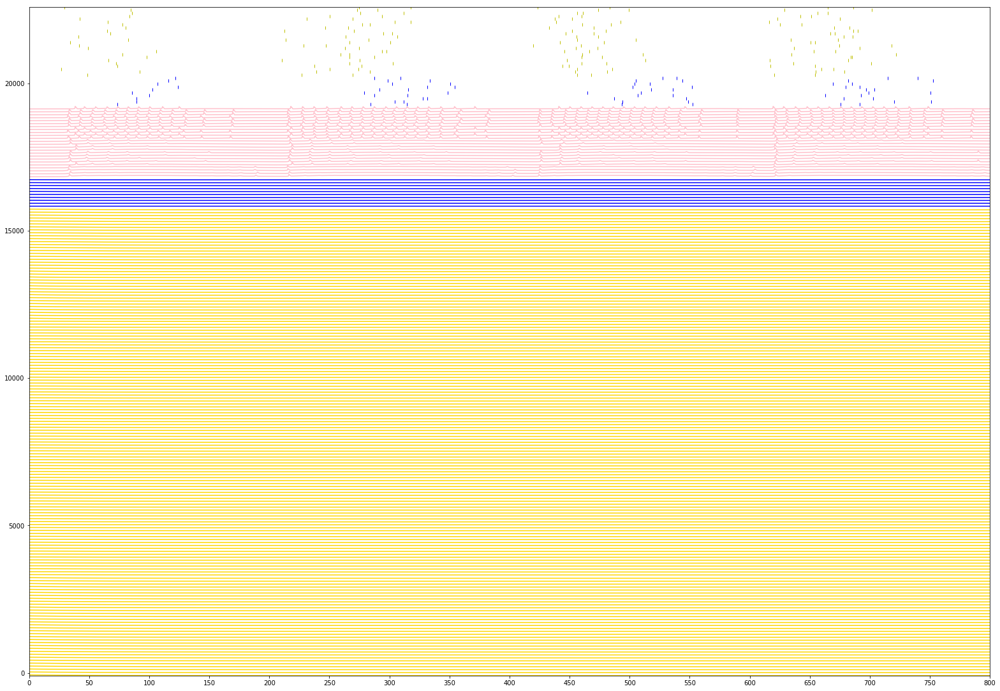

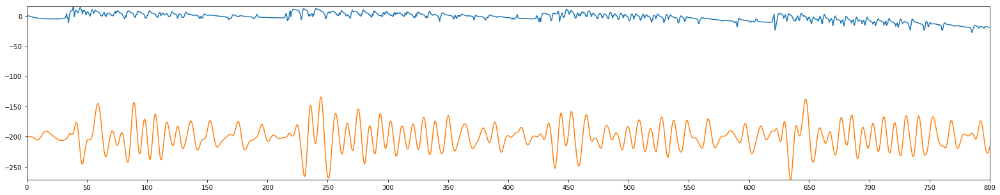

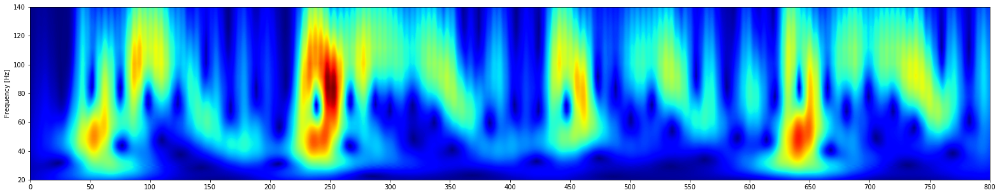

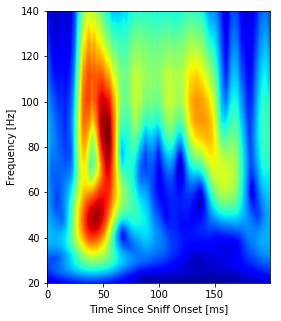

In [26]:
show_plots('PureTCsWithGJs')

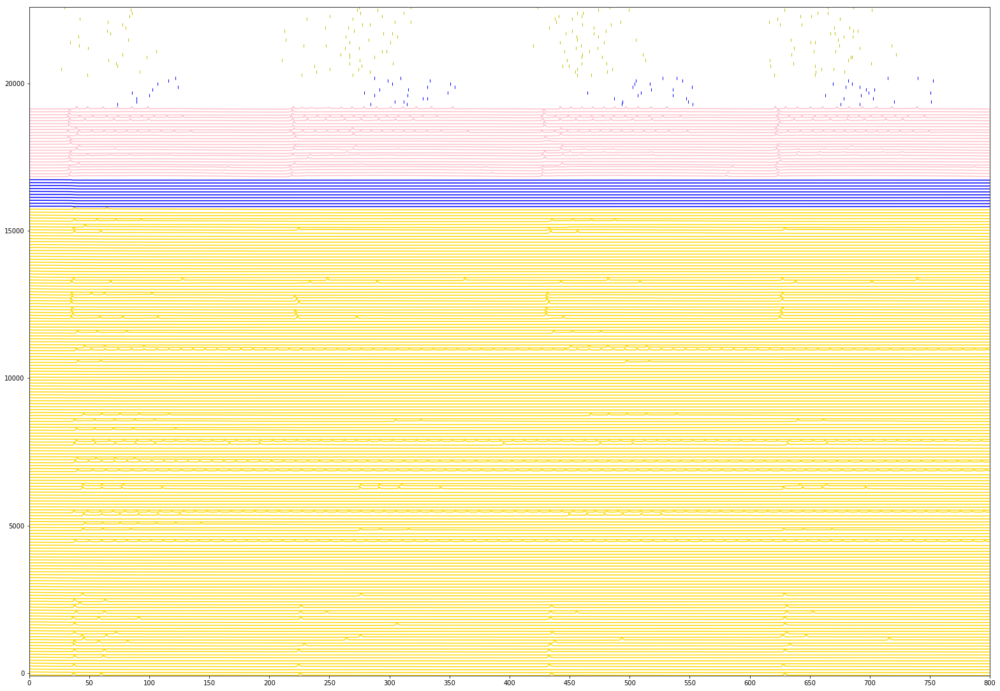

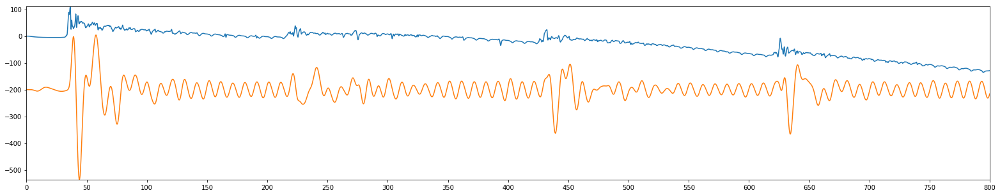

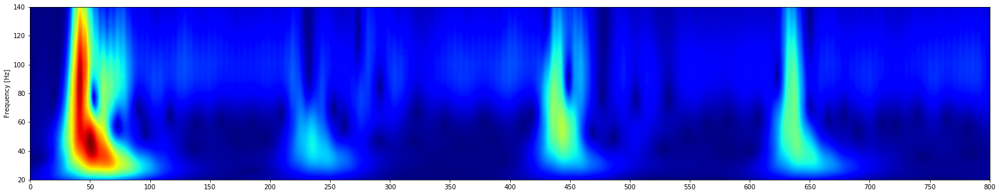

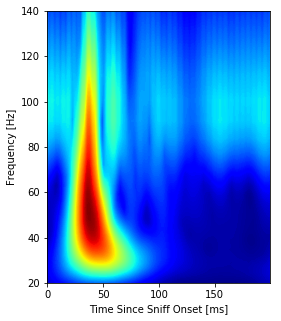

In [27]:
show_plots('TCsWithGJsGCs')

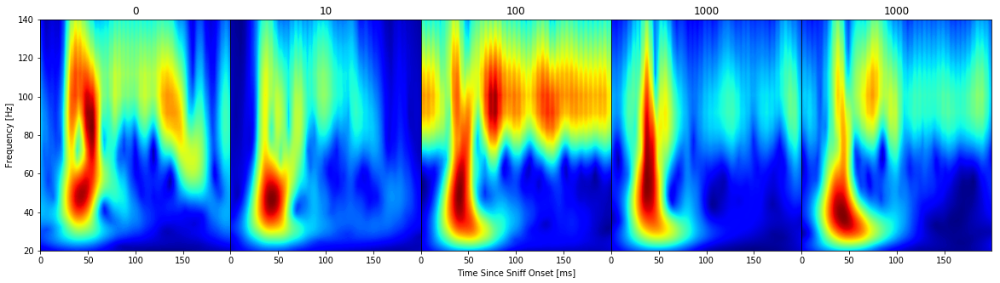

In [30]:
plot_average_vs_paramsets(
    ['TCsWithGJsGCsExc_0', 'TCsWithGJsGCsExc_10', 'TCsWithGJsGCsExc_100', 'TCsWithGJsGCsExc_1000', 'TCsWithGJsGCsExc_10000'],
    [0,10,100,1000,1000]
)

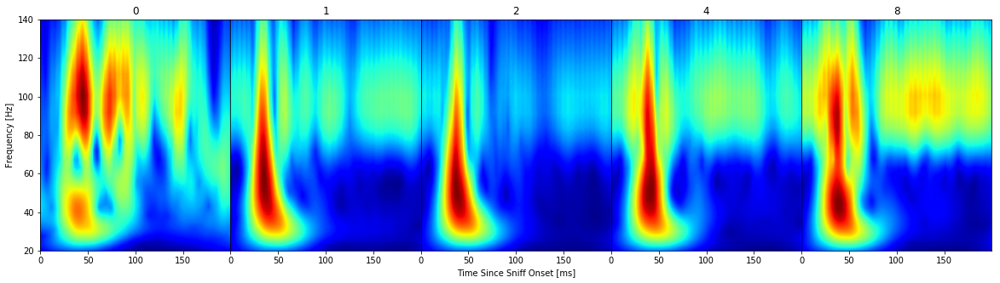

In [34]:
# Vary TC GC Inhib gmax=0 to 8
plot_average_vs_paramsets(['TCsWithGJsGCsInhib_0',
                'TCsWithGJsGCsInhib_1',
                'TCsWithGJsGCsInhib_2',
                'TCsWithGJsGCsInhib_4',
                'TCsWithGJsGCsInhib_8'], ["GABA gmax=0, 1, 2, 4, 8])

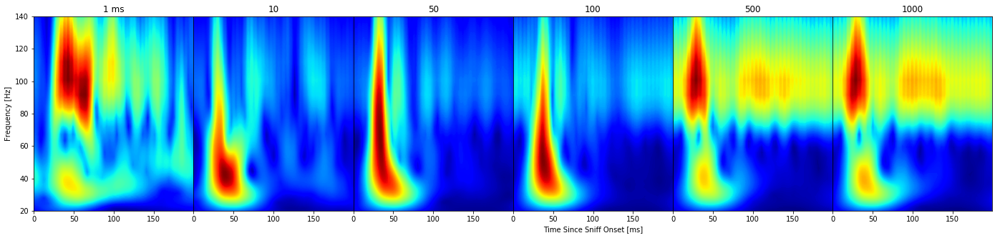

In [41]:
plot_average_vs_paramsets([
                'TCsWithGJsGCsTau2_1',
                'TCsWithGJsGCsTau2_10',
                'TCsWithGJsGCsTau2_50',
                'TCsWithGJsGCsTau2_100',
                'TCsWithGJsGCsTau2_500',    
                'TCsWithGJsGCsTau2_1000'], ["1 ms", 10, 50, 100, 500, 1000])

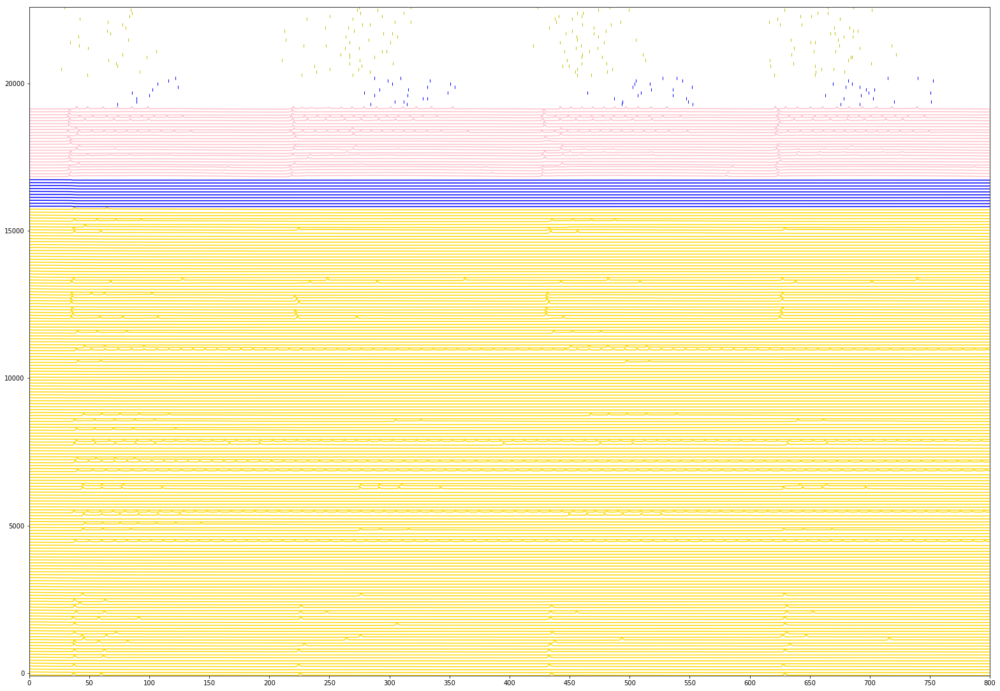

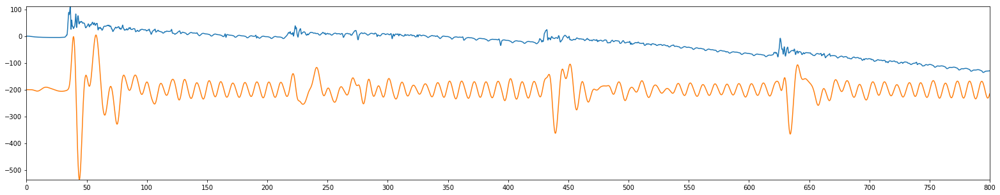

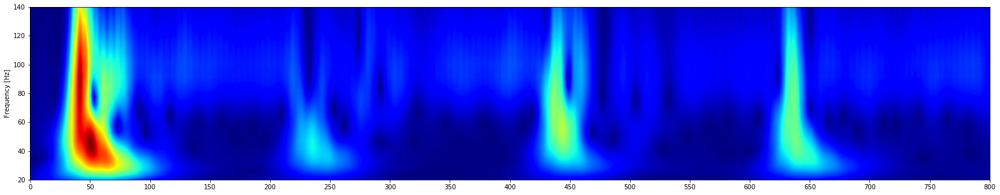

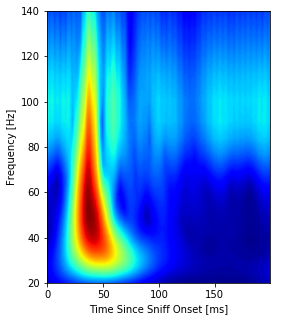

In [44]:
show_plots('TCsWithGJsGCs')

## Combined MC TC

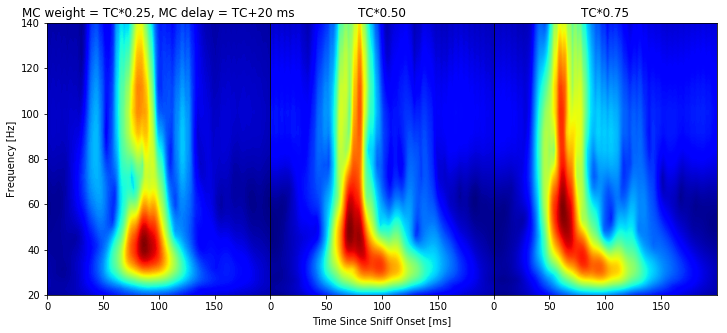

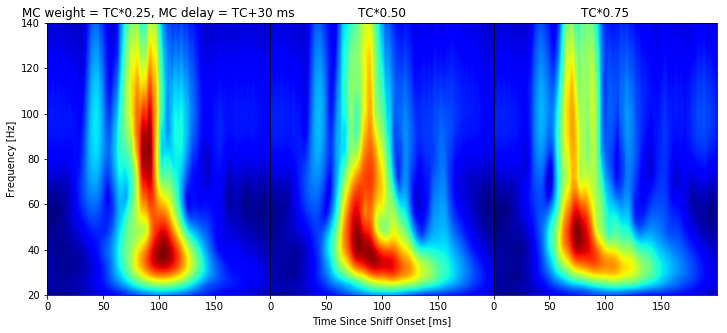

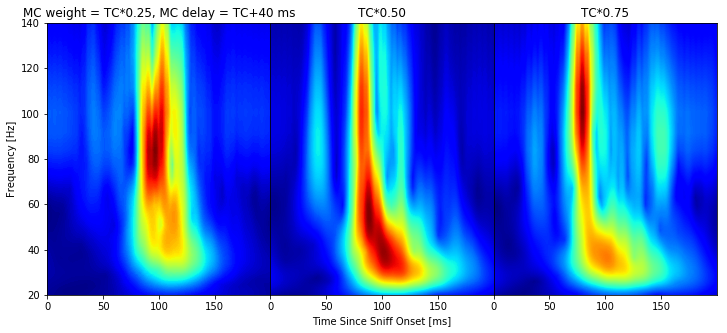

In [54]:
# Vary MC input delay, at MC weight = TC weight
plot_average_vs_paramsets([
                 'MC_TC_Combined_MC_weight_025_delay_20',
                'MC_TC_Combined_MC_weight_050_delay_20',
                'MC_TC_Combined_MC_weight_075_delay_20'],
                ['MC weight = TC*0.25, MC delay = TC+20 ms',
                'TC*0.50',
                'TC*0.75',])

plot_average_vs_paramsets([
                 'MC_TC_Combined_MC_weight_025_delay_30',
                'MC_TC_Combined_MC_weight_050_delay_30',
                'MC_TC_Combined_MC_weight_075_delay_30'],
                ['MC weight = TC*0.25, MC delay = TC+30 ms',
                'TC*0.50',
                'TC*0.75',])

plot_average_vs_paramsets([
                 'MC_TC_Combined_MC_weight_025_delay_40',
                'MC_TC_Combined_MC_weight_050_delay_40',
                'MC_TC_Combined_MC_weight_075_delay_40'],
                ['MC weight = TC*0.25, MC delay = TC+40 ms',
                'TC*0.50',
                'TC*0.75',])

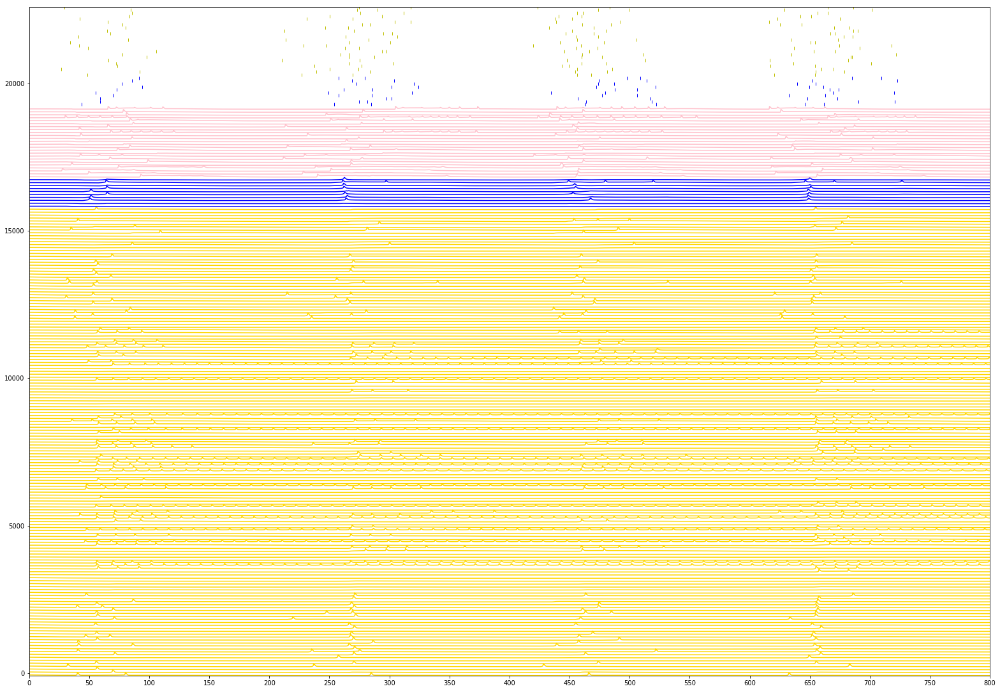

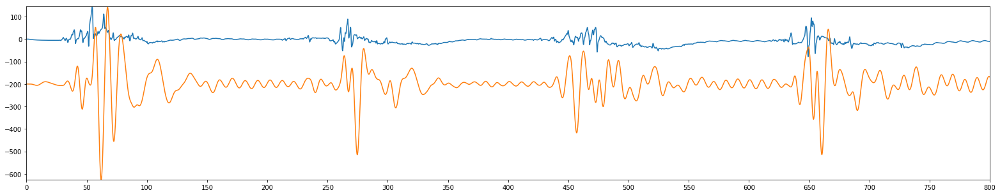

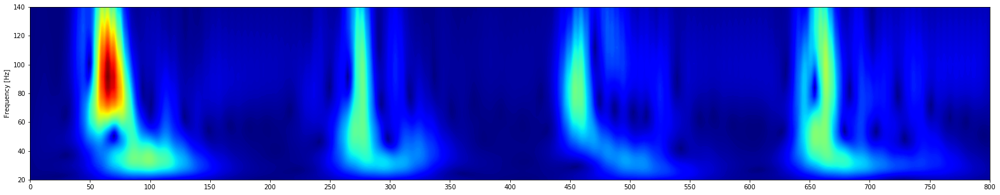

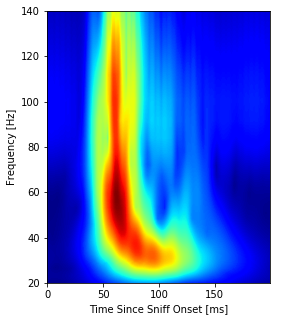

In [79]:
show_plots('MC_TC_Combined_MC_weight_075_delay_20')

In [73]:
!cd ..; python runbatch.py

Starting paramset: TwoGammaClusters (1/1)...
numprocs=16
Rank Complexity min: 551, mean: 662.625, max: 791
Starting simulation...
Time: 800.0 msWarning: h.t (800.1) is more than h.tstop (800.1). Please ensure h.tstop is set before h.run() or pc.psolve(). Stopping LFP collection.



In [80]:
!cd ..; mpiexec -n 16 python initslice.py -paramset GammaSignature -mpi

numprocs=16
Rank Complexity min: 551, mean: 662.625, max: 791
Starting simulation...
Time: 800.0 msWarning: h.t (800.1) is more than h.tstop (800.1). Please ensure h.tstop is set before h.run() or pc.psolve(). Stopping LFP collection.



In [ ]:
show_plots('PureTCs')

## TC-MC Combined Network

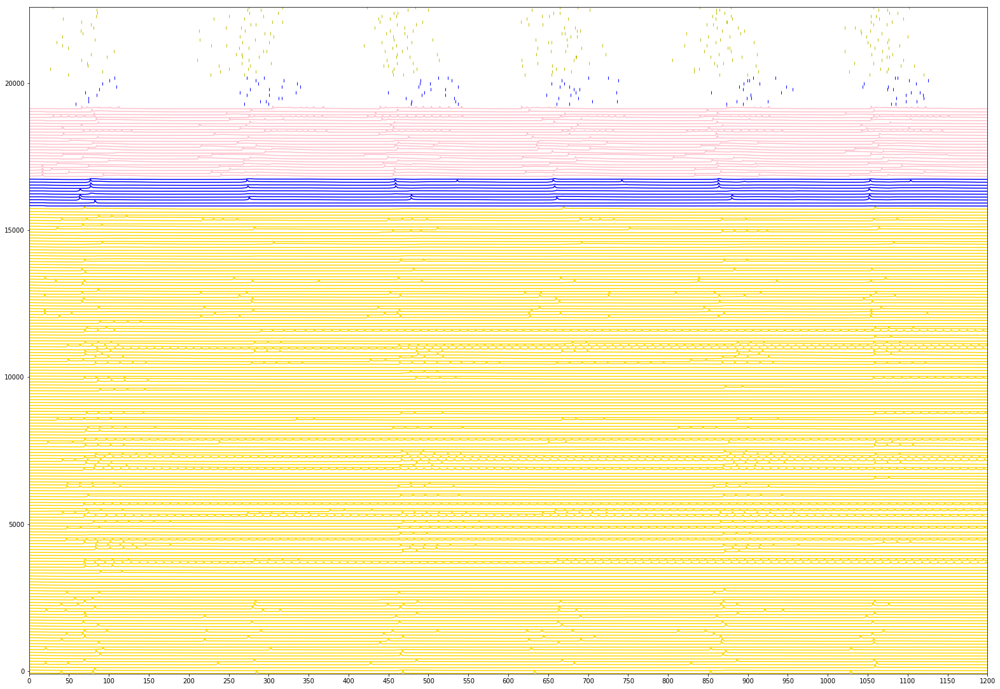

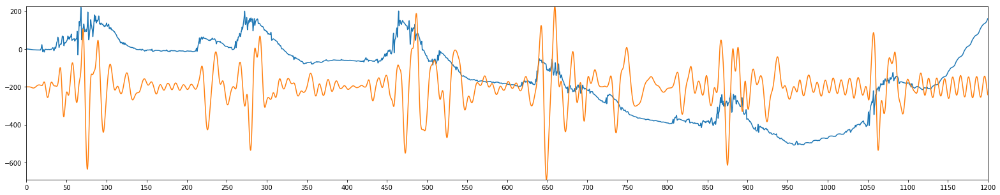

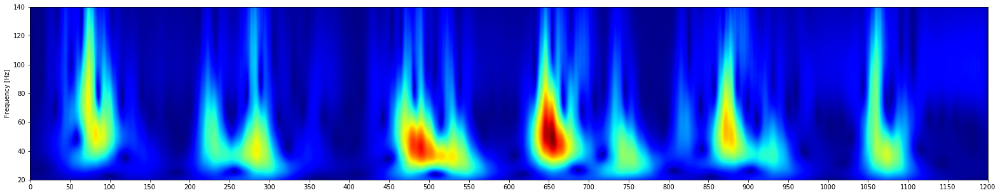

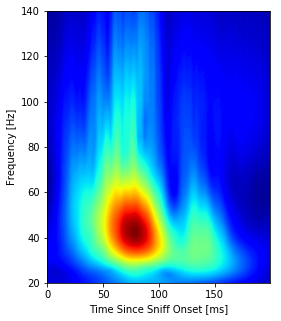

In [371]:
show_plots('SilentNetwork',sniff_count=5)

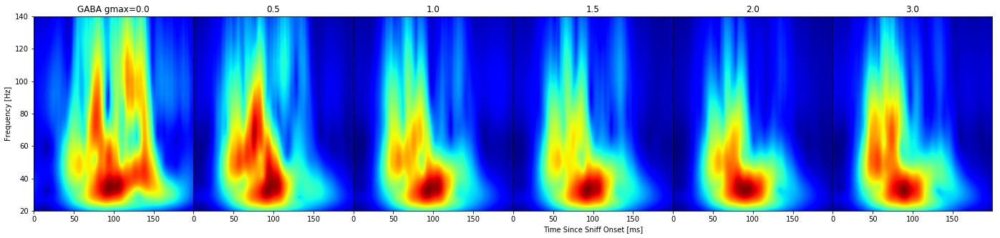

In [271]:
# Vary network GABA gmax 0-3.0
plot_average_vs_paramsets(['TwoGammaClusters_InhibGmax_00',
                            'TwoGammaClusters_InhibGmax_05',
                            'TwoGammaClusters_InhibGmax_10',
                            'TwoGammaClusters_InhibGmax_15',
                            'TwoGammaClusters_InhibGmax_20',
                            'TwoGammaClusters_InhibGmax_30'],
                           ['GABA gmax=0.0',
                            '0.5',
                            '1.0',
                            '1.5',
                            '2.0',
                            '3.0'])

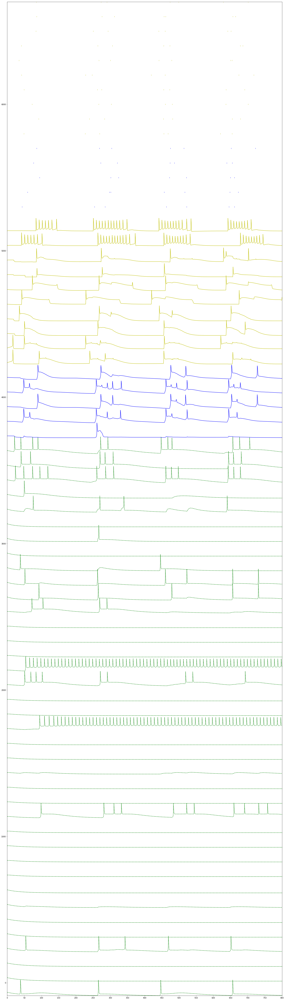

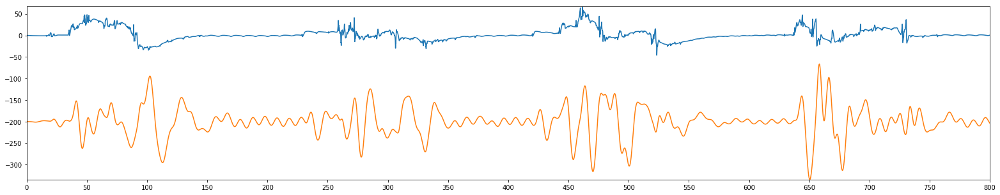

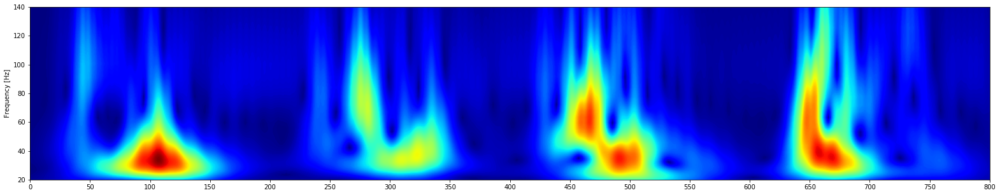

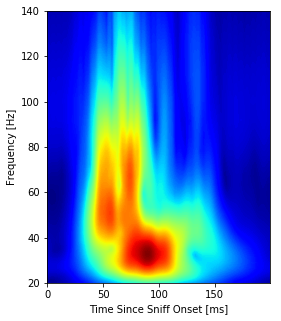

In [331]:
show_plots('TwoGammaClusters_InhibGmax_30')

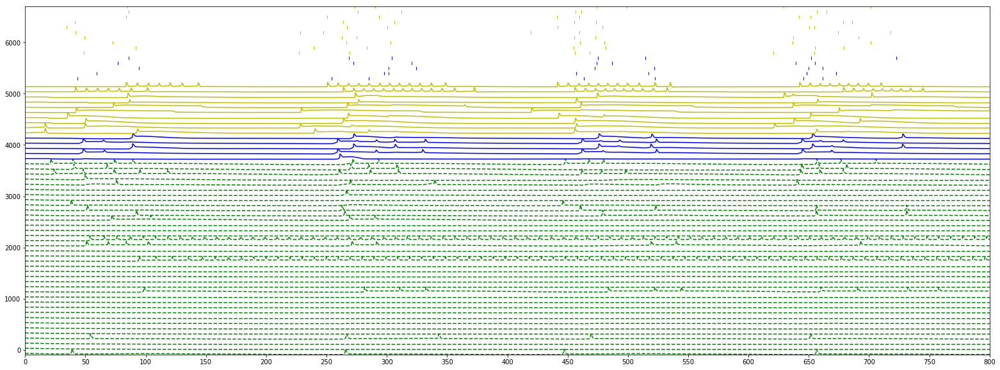

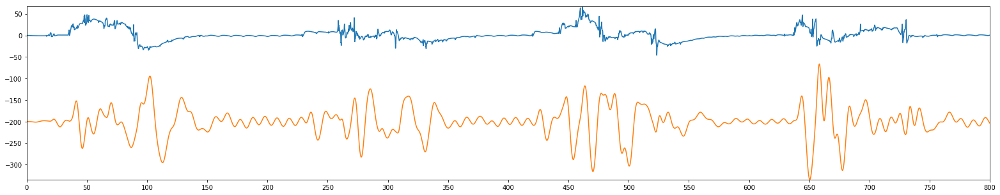

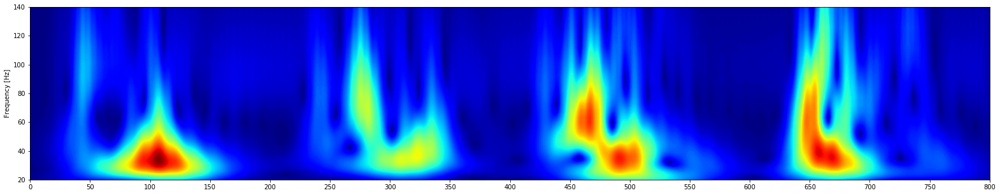

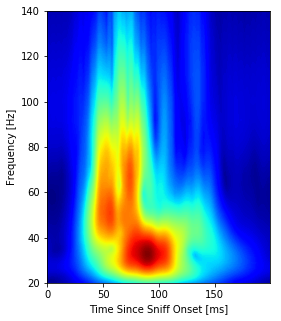

In [289]:
show_plots('TwoGammaClusters')

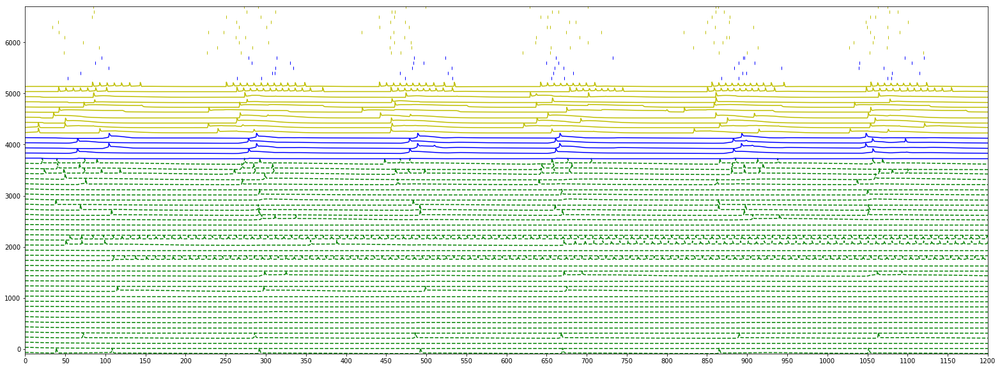

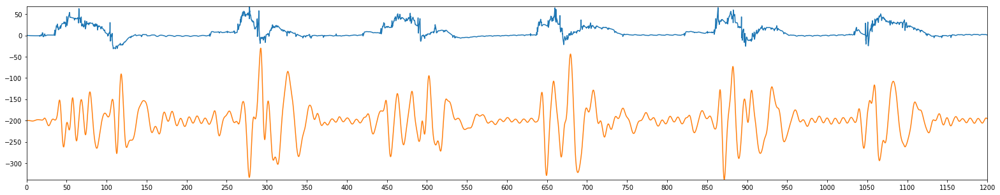

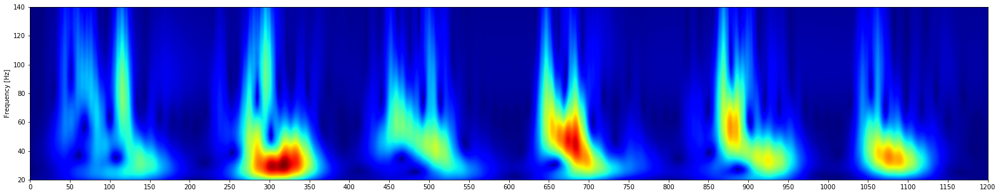

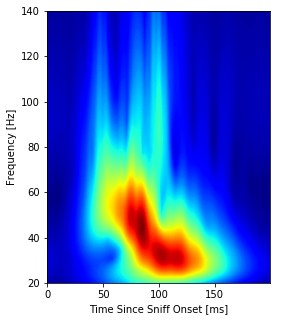

In [267]:
show_plots('MC_TC_Combined_MC_weight_010_delay_30')

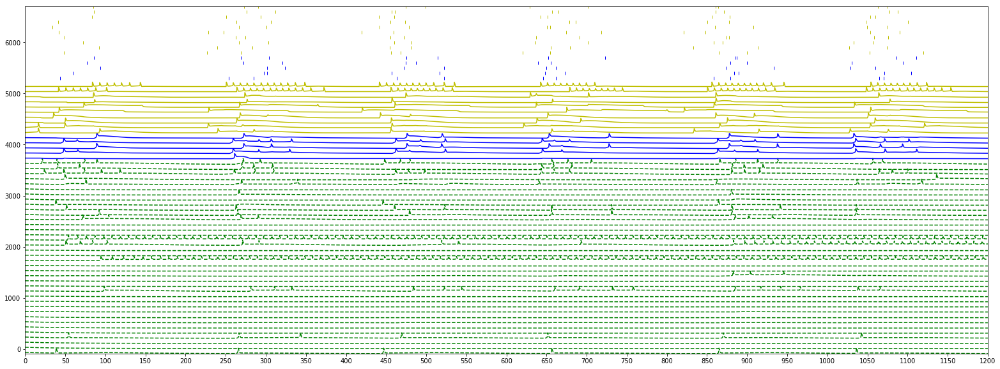

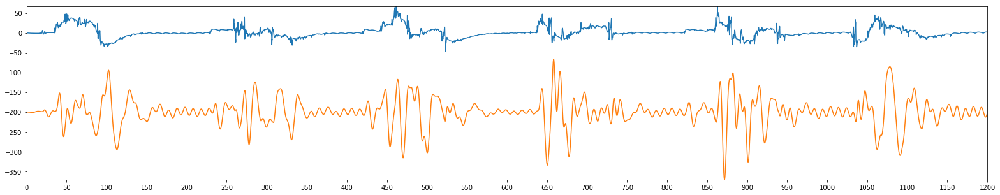

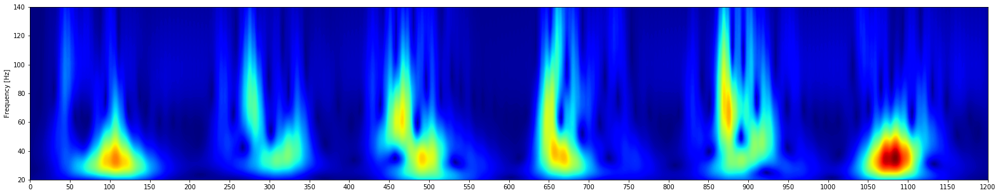

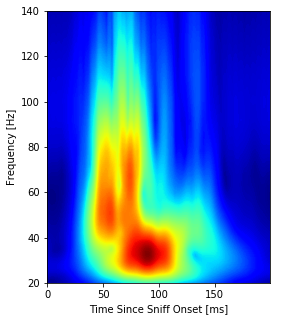

In [264]:
show_plots('MC_TC_Combined_MC_weight_050_delay_20')

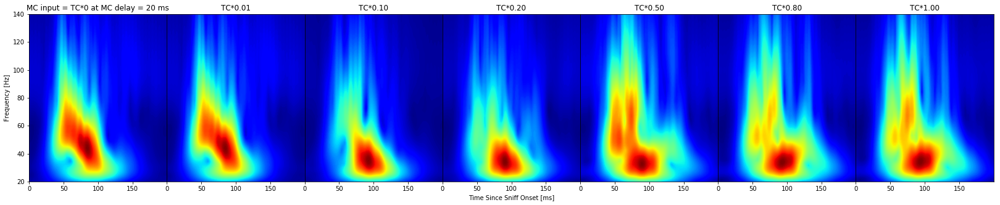

In [250]:
# Vary MC input weight, at MC delay=20
plot_average_vs_paramsets(['MC_TC_Combined_MC_weight_0_delay_20',
                            'MC_TC_Combined_MC_weight_001_delay_20',
                            'MC_TC_Combined_MC_weight_010_delay_20',
                            'MC_TC_Combined_MC_weight_020_delay_20',
                            'MC_TC_Combined_MC_weight_050_delay_20',
                            'MC_TC_Combined_MC_weight_080_delay_20',
                            'MC_TC_Combined_MC_weight_100_delay_20'],
                           ['MC input = TC*0 at MC delay = 20 ms',
                            'TC*0.01',
                            'TC*0.10',
                            'TC*0.20',
                            'TC*0.50',
                            'TC*0.80',
                            'TC*1.00'])

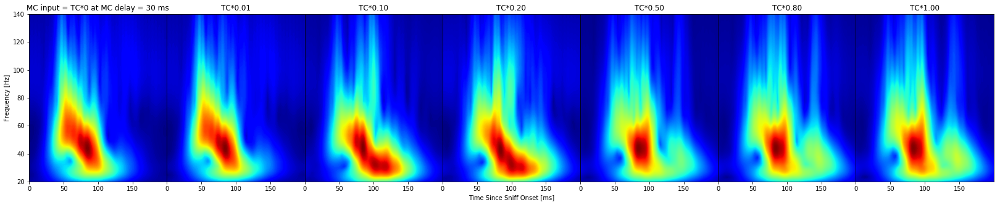

In [251]:
# Vary MC input weight, at MC delay=30
plot_average_vs_paramsets(['MC_TC_Combined_MC_weight_0_delay_30',
                            'MC_TC_Combined_MC_weight_001_delay_30',
                            'MC_TC_Combined_MC_weight_010_delay_30',
                            'MC_TC_Combined_MC_weight_020_delay_30',
                            'MC_TC_Combined_MC_weight_050_delay_30',
                            'MC_TC_Combined_MC_weight_080_delay_30',
                            'MC_TC_Combined_MC_weight_100_delay_30'],
                           ['MC input = TC*0 at MC delay = 30 ms',
                            'TC*0.01',
                            'TC*0.10',
                            'TC*0.20',
                            'TC*0.50',
                            'TC*0.80',
                            'TC*1.00'])

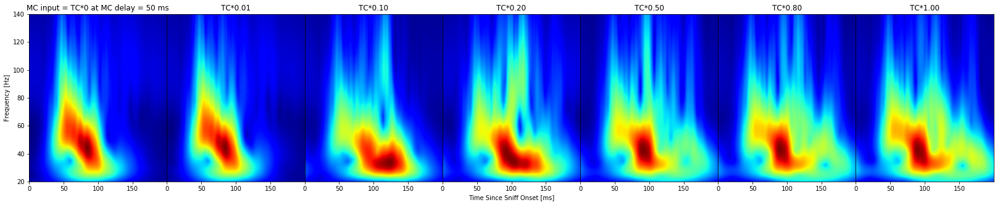

In [249]:
# Vary MC input weight, at MC delay=50
plot_average_vs_paramsets(['MC_TC_Combined_MC_weight_0',
                            'MC_TC_Combined_MC_weight_001',
                            'MC_TC_Combined_MC_weight_010',
                            'MC_TC_Combined_MC_weight_020',
                            'MC_TC_Combined_MC_weight_050',
                            'MC_TC_Combined_MC_weight_080',
                            'MC_TC_Combined_MC_weight_100'],
                           ['MC input = TC*0 at MC delay = 50 ms',
                            'TC*0.01',
                            'TC*0.10',
                            'TC*0.20',
                            'TC*0.50',
                            'TC*0.80',
                            'TC*1.00'])

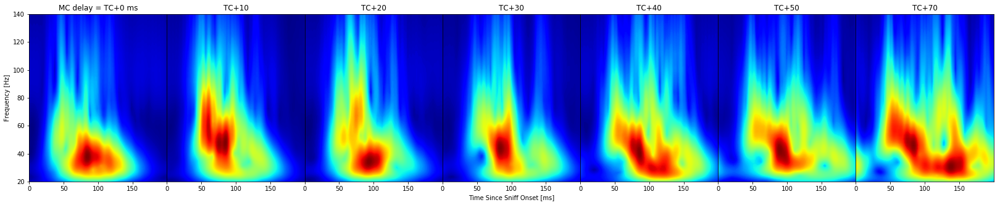

In [246]:
# Vary MC input delay, at MC weight = TC weight
plot_average_vs_paramsets([
                'MC_TC_Combined_MC_delay_0',
                'MC_TC_Combined_MC_delay_10',
                'MC_TC_Combined_MC_delay_20',
                'MC_TC_Combined_MC_delay_30',
                'MC_TC_Combined_MC_delay_40',
                'MC_TC_Combined_MC_delay_50',
                'MC_TC_Combined_MC_delay_70'],
                ['MC delay = TC+0 ms',
                'TC+10',
                'TC+20',
                'TC+30',
                'TC+40',
                'TC+50',
                'TC+70'])

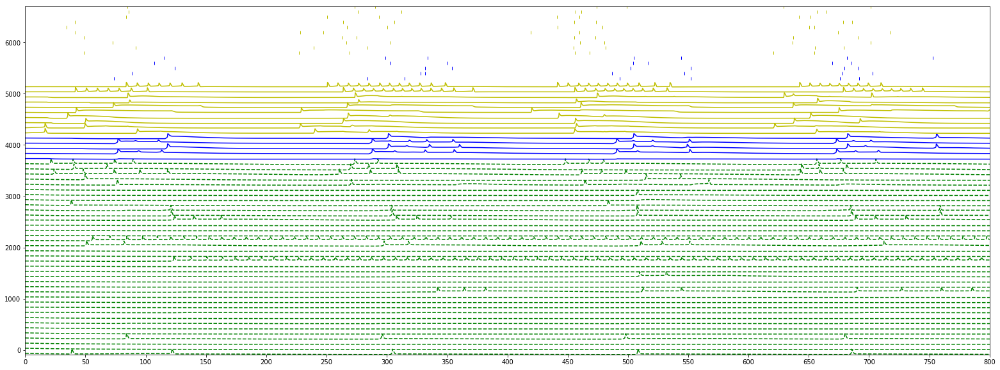

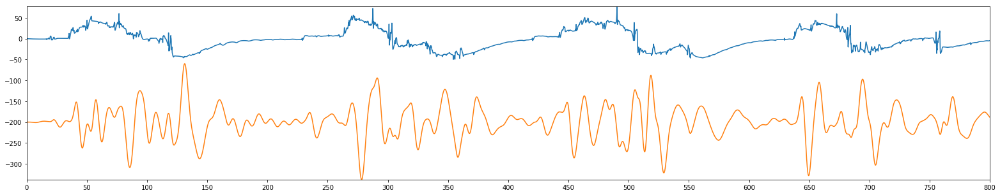

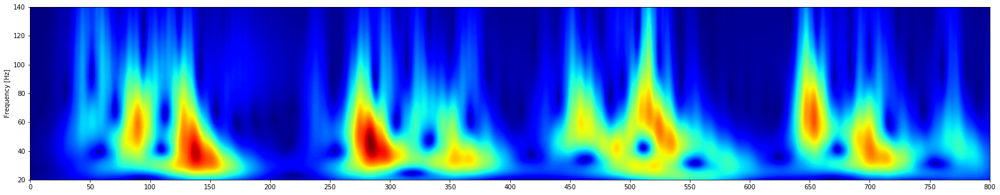

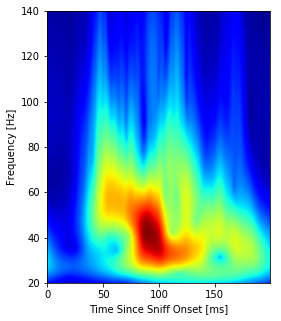

In [235]:
# TCs and MCs combined: initial combination
show_plots('MC_TC_Combined_Base')

## TC Isolated Circuit

<Figure size 432x288 with 0 Axes>

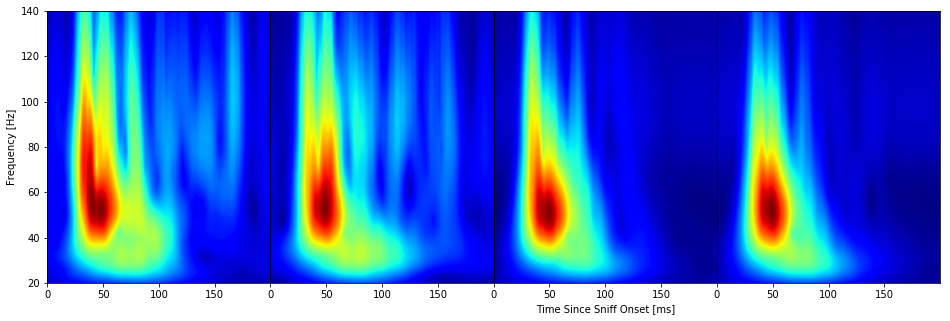

In [232]:
# Vary TC GC Inhib Tau2=1 to 1000
plot_average_vs_paramsets([
                'TCsWithGJsGCsTau2_1',
                'TCsWithGJsGCsTau2_10',
                'TCsWithGJsGCsTau2_100',
                'TCsWithGJsGCsTau2_1000'])

<Figure size 432x288 with 0 Axes>

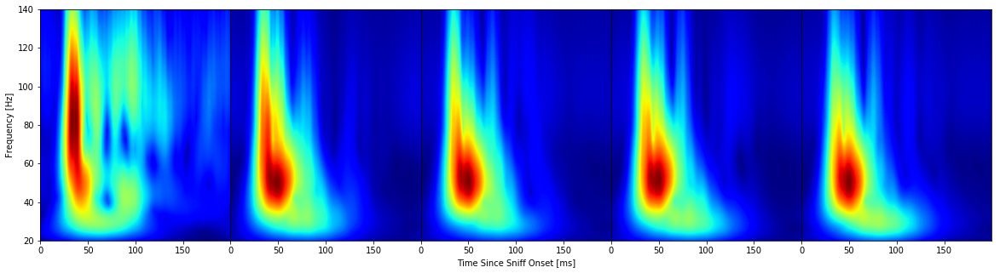

In [228]:
# Vary TC GC Inhib gmax=0 to 8
plot_average_vs_paramsets(['TCsWithGJsGCsInhib_0',
                'TCsWithGJsGCsInhib_1',
                'TCsWithGJsGCsInhib_2',
                'TCsWithGJsGCsInhib_4',
                'TCsWithGJsGCsInhib_8'])

<Figure size 432x288 with 0 Axes>

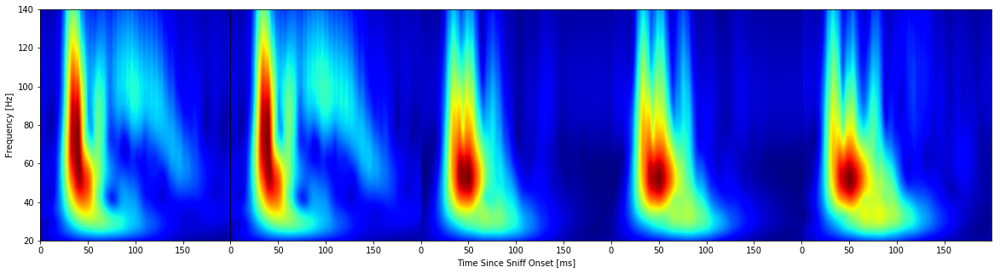

In [222]:
# Vary TC GC Exc gmax=0 to 10000
plot_average_vs_paramsets(['TCsWithGJsGCsExc_0', 'TCsWithGJsGCsExc_10', 'TCsWithGJsGCsExc_100', 'TCsWithGJsGCsExc_1000', 'TCsWithGJsGCsExc_10000'])

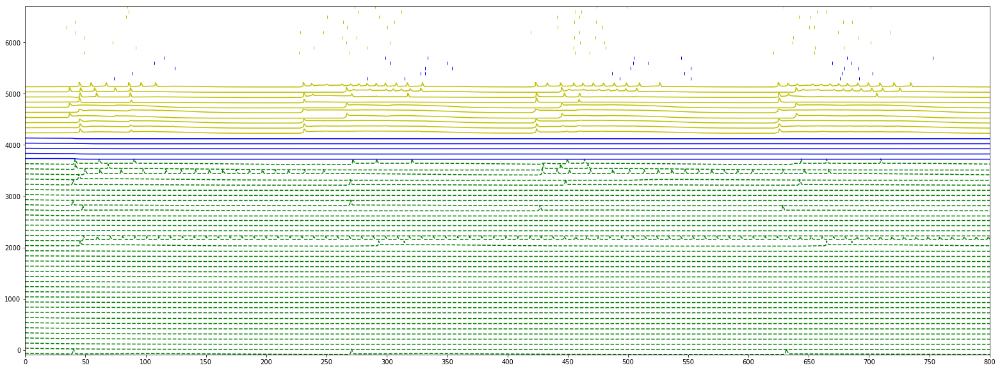

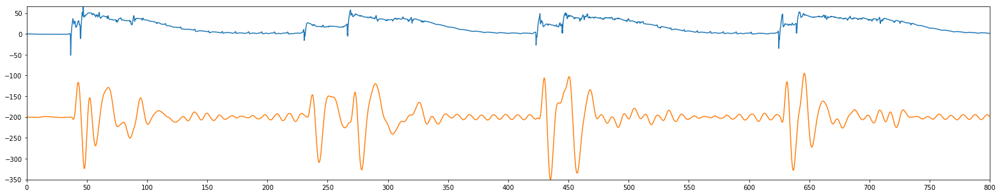

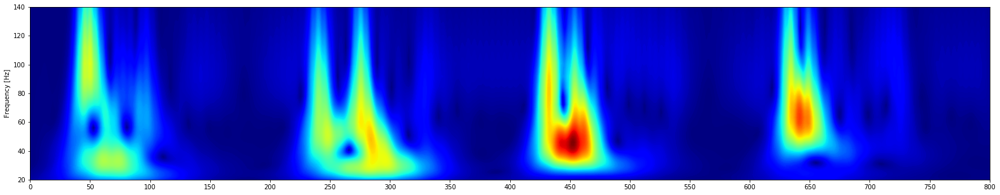

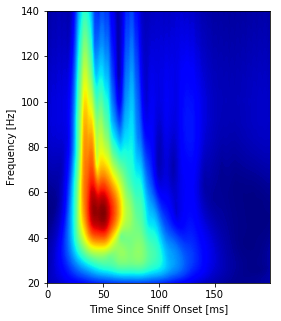

In [225]:
# TCs only w GJs and GCs
show_plots('TCsWithGJsGCs')

<Figure size 432x288 with 0 Axes>

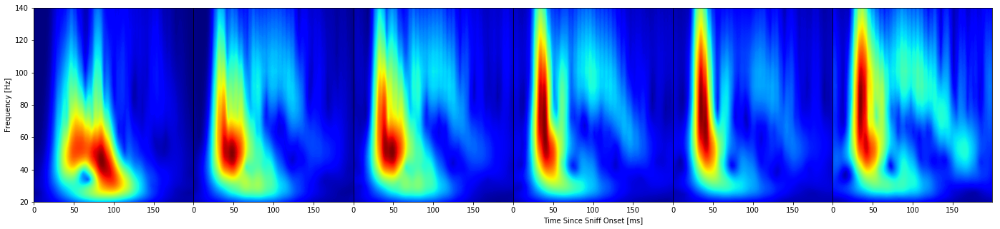

In [202]:
# Vary TC GJ g=0 to 32
plot_average_vs_paramsets(['TCGJ_0', 'TCGJ_2', 'TCGJ_4', 'TCGJ_8', 'TCGJ_16', 'TCGJ_32'])

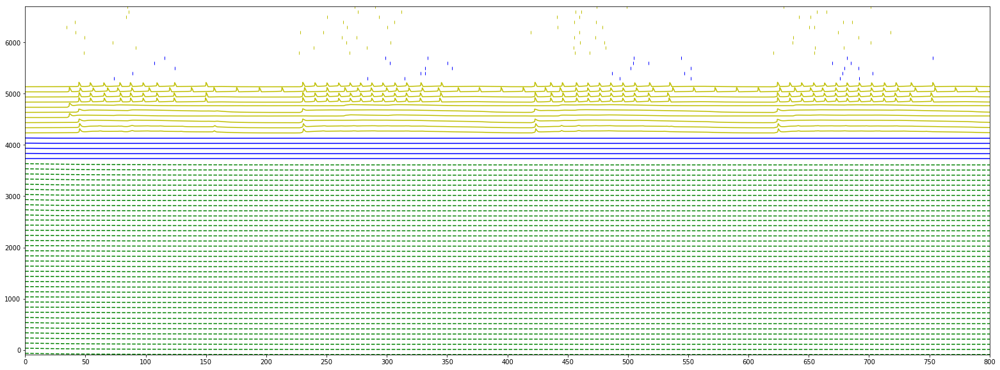

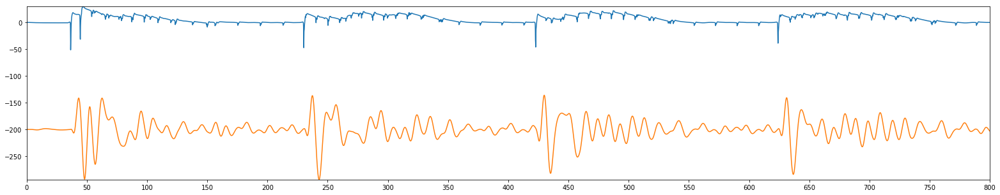

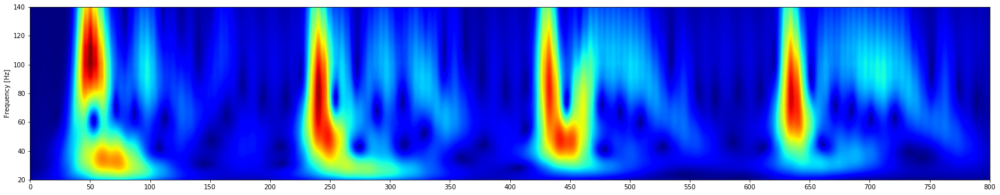

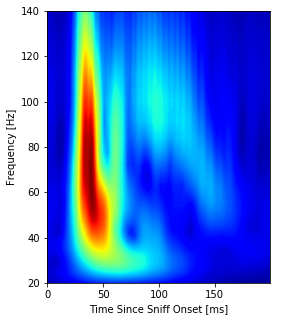

In [214]:
# TCs only w GJs - No GCs
show_plots('TCGJ_8')

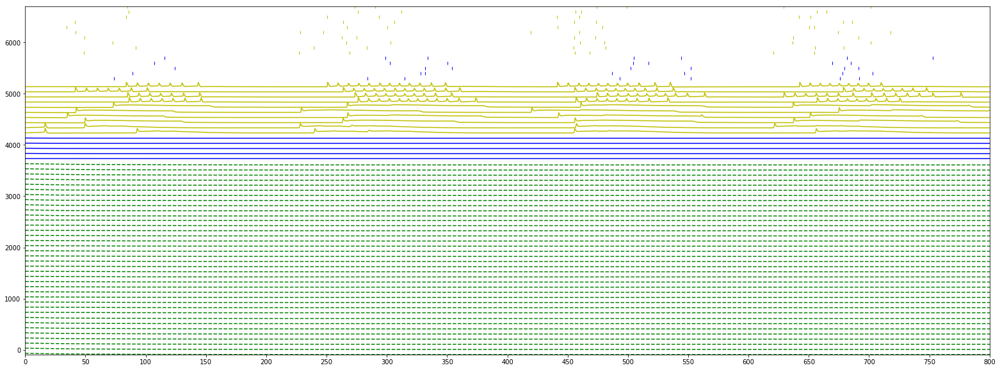

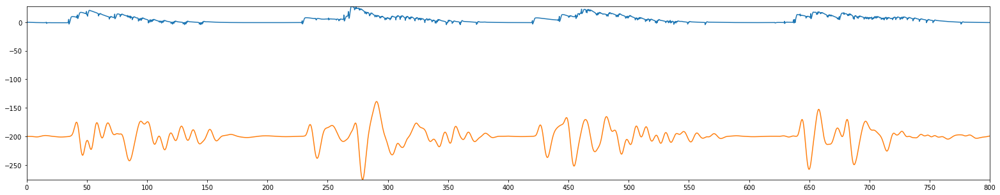

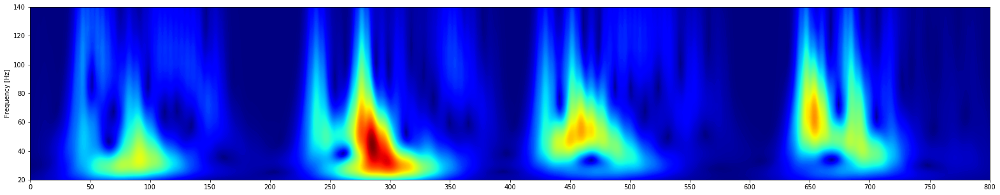

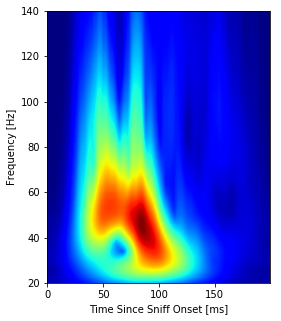

In [197]:
# TCs only - No GCs
show_plots('PureTCs')

## Isolated MC Circuit

<Figure size 432x288 with 0 Axes>

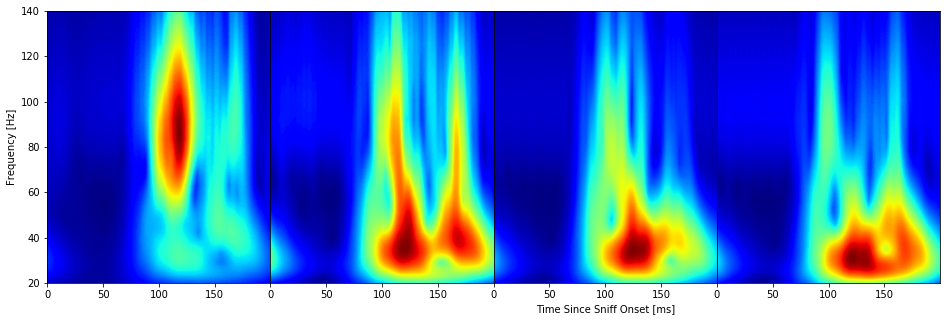

In [233]:
# Vary MC GC Inhib Tau2=1 to 1000
plot_average_vs_paramsets([
                'MCsWithGJsGCsTau2_1',
                'MCsWithGJsGCsTau2_10',
                'MCsWithGJsGCsTau2_100',
                'MCsWithGJsGCsTau2_1000'])

<Figure size 432x288 with 0 Axes>

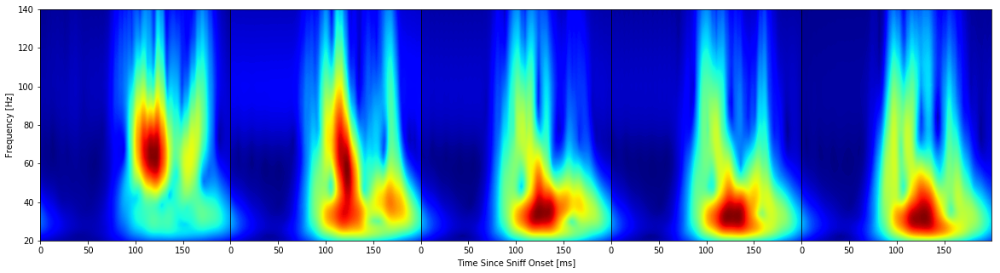

In [229]:
# Vary MC GC Inhib gmax=0 to 8
plot_average_vs_paramsets(['MCsWithGJsGCsInhib_0',
                'MCsWithGJsGCsInhib_1',
                'MCsWithGJsGCsInhib_2',
                'MCsWithGJsGCsInhib_4',
                'MCsWithGJsGCsInhib_8'])

<Figure size 432x288 with 0 Axes>

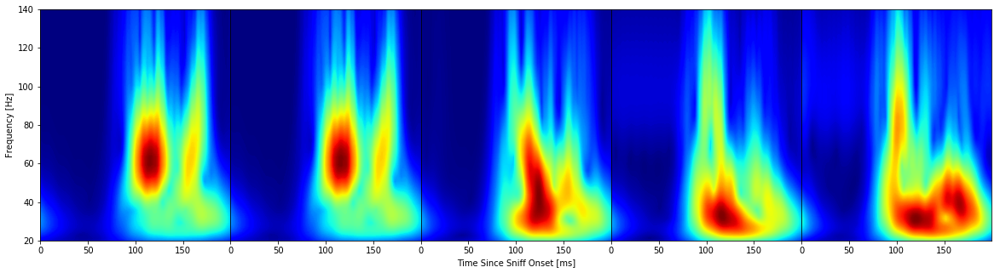

In [223]:
# Vary MC GC Exc gmax=0 to 10000
plot_average_vs_paramsets(['MCsWithGJsGCsExc_0', 'MCsWithGJsGCsExc_10', 'MCsWithGJsGCsExc_100', 'MCsWithGJsGCsExc_1000', 'MCsWithGJsGCsExc_10000'])

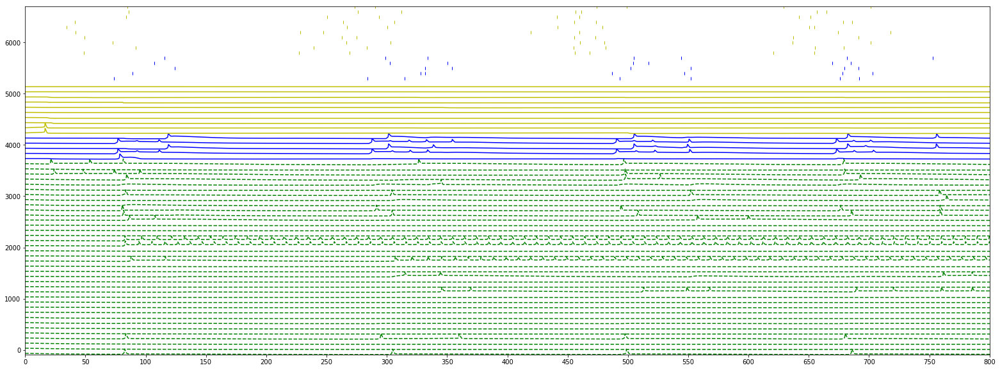

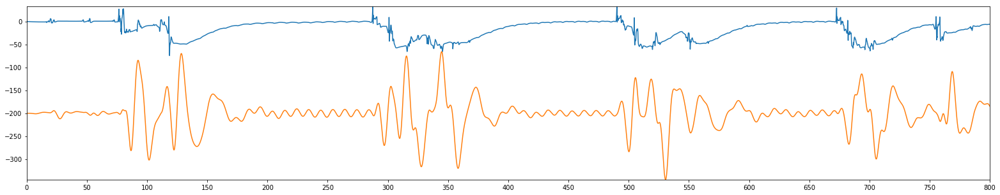

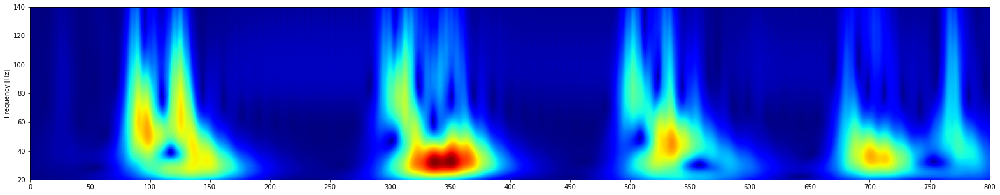

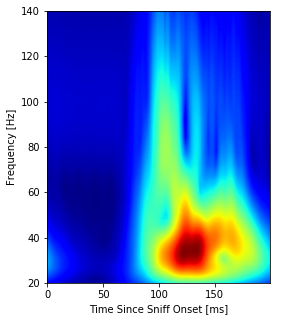

In [226]:
# MCs only w GJs and GCs
show_plots('MCsWithGJsGCs')

<Figure size 432x288 with 0 Axes>

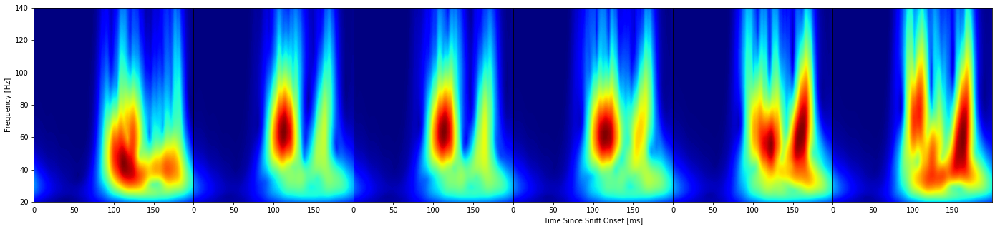

In [203]:
# Vary MC GJ g=0 to 32
plot_average_vs_paramsets(['MCGJ_0', 'MCGJ_2', 'MCGJ_4', 'MCGJ_8', 'MCGJ_16', 'MCGJ_32'])

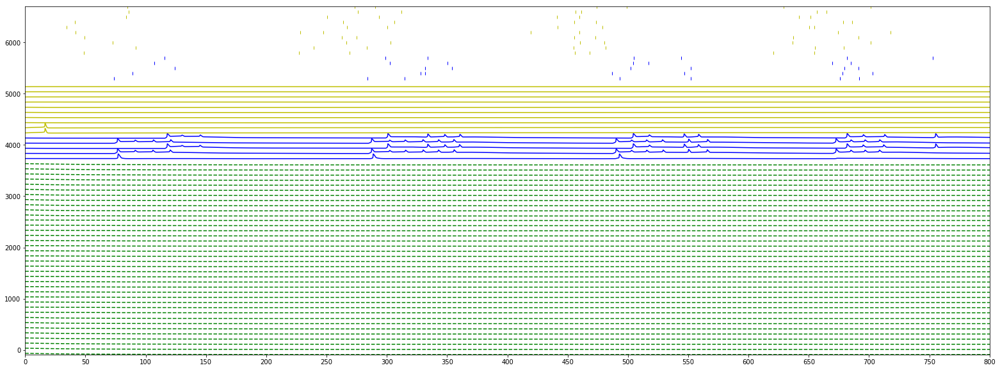

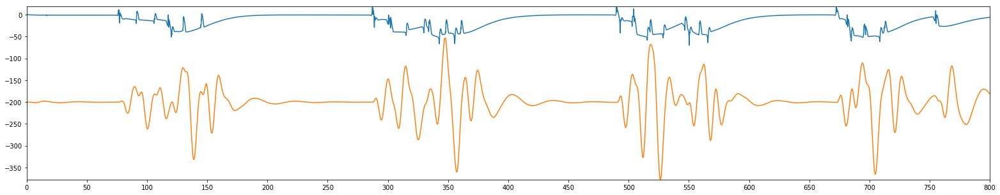

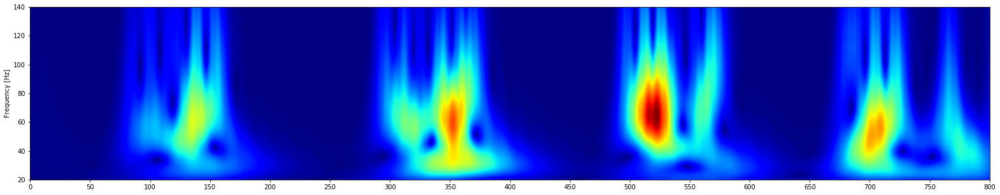

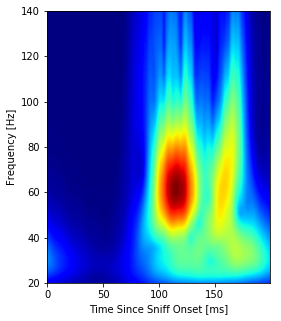

In [216]:
# MCs only w GJs - No GCs
show_plots('MCGJ_8')

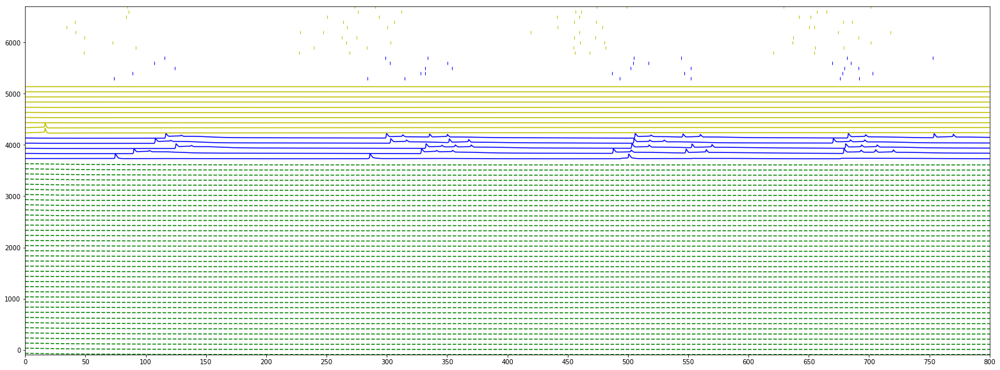

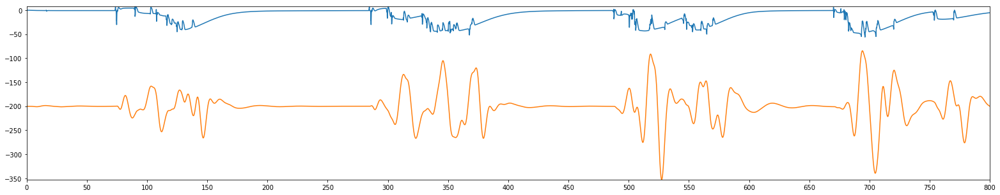

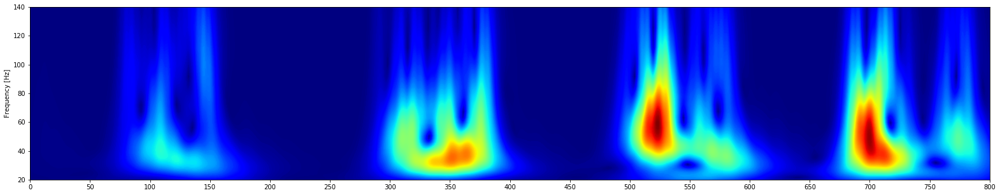

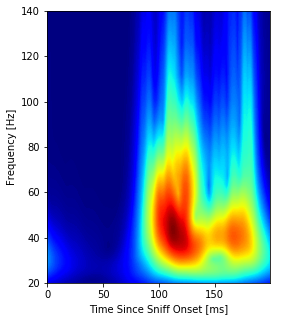

In [199]:
# MCs only - No GCs
show_plots('PureMCs')